In [3]:
!pip install gurobipy #tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 82.5 MB/s eta 0:00:00:00:0100:01


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# from sklearn.preprocessing import

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Layer, Concatenate
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import EarlyStopping

import torch
import torch.nn as nn
import torch.nn.functional as F

import gurobipy as gp
from gurobipy import GRB

# Optional: torch_geometric for graph layers
try:
    from torch_geometric.nn import GATConv
    from torch_geometric.data import Data as GeoData
except Exception:
    GATConv = None
    GeoData = None


# 25-26


## Data Prep


In [140]:
data_25_26 = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/Prediction%20with%20Affine%20PNN/data/rolled_player_data.csv')
gw=22

cols = [

    'fpl_id', 'round', 'fpl_name', 'position', 'team_id', 'team', 'opponent_team', 'was_home', 'xP', #'xP_next',
    'selected_by_percent','value', 'form', 'value_form', #'chance_of_playing_next_round', 'chance_of_playing_this_round',
    'transfers_in', 'transfers_out',  'selected', 'ownership_change', 'percenatge_net_transfers', 'cbitr_volume_90', 'cbitr_probability',

    'elo',  'team_h_difficulty', 'team_a_difficulty', #'strength', 'strength_overall_home', 'strength_overall_away', 'strength_attack_home', 'strength_attack_away', 'strength_defence_home',
    #'strength_defence_away',  #'win_prob', 'draw_prob', 'lose_prob',

    # 'creativity_1', 'creativity_3', 'creativity_5', 'influence_1', 'influence_3', 'influence_5', 'threat_1', 'threat_3', 'threat_5', 'minutes_1', 'minutes_3',
    # 'minutes_5', 'pts_bonus_1', 'pts_bonus_3', 'pts_bonus_5', 'expected_goals_1', 'expected_goals_3',
    # 'expected_goals_5', 'expected_assists_1', 'expected_assists_3', 'expected_assists_5', 'xP_1', 'xP_3', 'xP_5', 'expected_goals_conceded_1',
    # 'expected_goals_conceded_3', 'expected_goals_conceded_5', 'goals_conceded_1', 'goals_conceded_3', 'goals_conceded_5', 'goals_scored_1', 'goals_scored_3',
    # 'goals_scored_5', 'shots_1', 'shots_3', 'shots_5', 'key_passes_1', 'key_passes_3', 'key_passes_5', 'npg_1', 'npg_3', 'npg_5', 'npxG_1', 'npxG_3', 'npxG_5',
    # 'goals_1', 'goals_3', 'goals_5', 'xG_1', 'xG_3', 'xG_5', 'xA_1', 'xA_3', 'xA_5', 'saves_1', 'saves_3', 'saves_5', 'starts_1', 'starts_3', 'starts_5',
    # 'yellow_cards_1', 'yellow_cards_3', 'yellow_cards_5', 'red_cards_1', 'red_cards_3', 'red_cards_5', 'assists_1', 'assists_3', 'assists_5', 'clean_sheets_1',
    # 'clean_sheets_3', 'clean_sheets_5', 'value_1', 'value_3', 'value_5', 'ict_index_1', 'ict_index_3', 'ict_index_5', 'selected_1', 'selected_3', 'selected_5',
    # 'transfers_in_1', 'transfers_in_3', 'transfers_in_5', 'transfers_out_1', 'transfers_out_3', 'transfers_out_5', 'ownership_change_1', 'ownership_change_3',
    # 'ownership_change_5', 'percenatge_net_transfers_1', 'percenatge_net_transfers_3', 'percenatge_net_transfers_5', 'xGChain_1', 'xGChain_3', 'xGChain_5',
    # 'xGBuildup_1', 'xGBuildup_3', 'xGBuildup_5', 'expected_goal_involvements_1', 'expected_goal_involvements_3', 'expected_goal_involvements_5', 'form_1', 'form_3',
    # 'form_5', 'clearances_blocks_interceptions_1', 'clearances_blocks_interceptions_3', 'clearances_blocks_interceptions_5', 'tackles_1', 'tackles_3', 'tackles_5',
    # 'recoveries_1', 'recoveries_3', 'recoveries_5', 'selected_by_percent_1',
    # 'selected_by_percent_3', 'selected_by_percent_5', 'strength_1', 'strength_3', 'strength_5', 'strength_overall_home_1', 'strength_overall_home_3',
    # 'strength_overall_home_5', 'strength_overall_away_1', 'strength_overall_away_3', 'strength_overall_away_5', 'strength_attack_home_1', 'strength_attack_home_3',
    # 'strength_attack_home_5', 'strength_attack_away_1', 'strength_attack_away_3', 'strength_attack_away_5', 'strength_defence_home_1', 'strength_defence_home_3',
    # 'strength_defence_home_5', 'strength_defence_away_1', 'strength_defence_away_3', 'strength_defence_away_5',

    # 'opp_elo', 'opp_clean_sheets', 'opp_strength'
    ]


data_25_26 = data_25_26.rename({'web_name': 'fpl_name'}, axis=1)

data_25_26 = data_25_26[ (data_25_26['minutes_3'] >= 10) ] #(data_25_26['minutes_1'] > 0) |

active_data = data_25_26[cols].copy()
active_data_ = active_data.copy()


# active_data_['opponent_difficulty'] = active_data_.apply(
#     lambda row: (row['draw_prob'] + row['lose_prob'])
#     if row['was_home']
#     else (row['draw_prob'] + row['win_prob']),
#     axis=1
# )

# active_data_['team_difficulty'] = active_data_.apply(
#     lambda row: (row['draw_prob'] + row['lose_prob'])
#     if not row['was_home']
#     else (row['draw_prob'] + row['win_prob']),
#     axis=1
# )

CATEGORICAL_COLS = ['position', 'team', 'opponent_team']

# Initialize encoder
# handle_unknown='ignore' ensures new teams result in all-zero rows for those features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical columns
encoded_array = encoder.fit(active_data_[CATEGORICAL_COLS])

# Create a DataFrame with the encoded features
encoded_cols = encoder.get_feature_names_out(CATEGORICAL_COLS)
encoded_df = pd.DataFrame(
    encoder.transform(active_data_[CATEGORICAL_COLS]),
    columns=encoded_cols,
    index=active_data_.index
)


cols = [*cols, *encoded_cols]
# Combine with numerical data
active_data_ = pd.concat([active_data_, encoded_df], axis=1).drop(columns=CATEGORICAL_COLS)
active_data_

,fpl_id,round,fpl_name,team_id,was_home,xP,selected_by_percent,value,form,value_form,...,opponent_team_11.0,opponent_team_12.0,opponent_team_13.0,opponent_team_14.0,opponent_team_15.0,opponent_team_16.0,opponent_team_17.0,opponent_team_18.0,opponent_team_19.0,opponent_team_20.0
0,1.0,1,Raya,1.0,False,4.2,36.9,55.0,3.2,0.5,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,2,Raya,1.0,True,9.0,21.5,55.0,8.0,1.5,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,3,Raya,1.0,False,5.5,21.8,55.0,6.0,1.1,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,4,Raya,1.0,True,6.5,23.5,55.0,6.0,1.1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,5,Raya,1.0,True,4.0,24.0,55.0,4.0,0.7,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6741,785.0,22,Pablo,19.0,False,0.0,0.0,55.0,0.5,0.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
6745,789.0,22,Merrick,7.0,True,0.0,0.0,40.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6747,791.0,21,Taty,19.0,True,1.9,0.0,55.0,2.0,0.4,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
6748,791.0,22,Taty,19.0,False,0.0,0.0,55.0,2.0,0.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [51]:
# active_data_['minutes_5'].min

### Functions


In [132]:
# --- Step 1: Data Preparation Function ---
def prepare_fpl_data(data, cols):
    """
    Prepares features (X), conditional parameters (M), targets (Y),
    and gameweeks (GW) for the AffinePNN model.
    """
    cols_ = list(cols)
    # if 'team_difficulty' not in cols_:
    #     cols_.append('team_h_difficulty', 'team_a_difficulty')

    data_ = data.copy()

    # Target and metadata columns
    target_col = ['xP', 'fpl_name', ]
    gameweek_col = 'round'
    POSITION_COL = 'position'
    M_COLS = ['position_DEF', 'position_FWD', 'position_GK', 'position_MID'] #, 'whh', 'whd', 'wha'

    # 2. Target Variable (Y)
    Y = data_[target_col].fillna(0)

    # 3. Input Features (X)
    EXCLUDE_COLS = [*target_col, gameweek_col, *M_COLS]

    # Find position-related columns for explicit inclusion if needed
    new_position_cols = [col for col in data_.columns if col.startswith(f'{POSITION_COL}_')]

    # Filter feature columns
    X_cols = [c for c in data_.columns if c not in EXCLUDE_COLS and c != POSITION_COL]

    # Final check of column existence
    X_cols = [col for col in X_cols if col in data_.columns]

    # Convert to numpy
    X = data_[X_cols].drop(columns=['fpl_id', 'team_id'])
    X = X.fillna(0).values.astype(np.float32)

    M = data_[M_COLS].fillna(0).values.astype(np.float32)
    GW = data_[gameweek_col].values



    print(f"Data prepared. X shape: {X.shape}, M shape: {M.shape}, Y shape: {Y.shape}")
    return X, M, Y, GW, X_cols

def transform_data(final_df, cols, gw):
    # Prepare data
    X_full, M_full, Y_full, GW_full, X_cols = prepare_fpl_data(final_df, cols)
    # print(X_full.shape)
    # Split
    GW_TRAIN_END = gw - 1
    GW_TRAIN_START = GW_TRAIN_END - 10
    train_mask = (GW_full >= GW_TRAIN_START) & (GW_full <= GW_TRAIN_END)
    test_mask = GW_full == (GW_TRAIN_END + 1)

    X_train, M_train, Y_train_raw = X_full[train_mask], M_full[train_mask], Y_full[train_mask]
    X_test, M_test, Y_test_raw = X_full[test_mask], M_full[test_mask], Y_full[test_mask]

    Y_train = Y_train_raw['xP'].values
    Y_train_names = Y_train_raw['fpl_name'].values

    Y_test = Y_test_raw['xP'].values
    Y_test_names = Y_test_raw['fpl_name'].values

    # Scaling
    scaler_x = StandardScaler()
    X_train_scaled = scaler_x.fit_transform(X_train)

    if X_test.size > 0:
        X_test_scaled = scaler_x.transform(X_test)
    else:
        X_test_scaled = scaler_x

    scaler_m = StandardScaler()
    M_train_scaled = scaler_m.fit_transform(M_train)

    if M_test.size > 0:
        M_test_scaled = scaler_m.transform(M_test)
    else:
        M_test_scaled = scaler_m

    # print('----', Y_train)

    return (X_train_scaled, M_train_scaled, train_mask, Y_train, Y_train_names), (X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names), GW_full, X_cols#, scaler_x, scaler_m

# --- Step 2: Custom Affine Conditioning Layer ---
class AffineConditioning(Layer):
    """
    Custom Keras Layer implementing the core Affine Parametric Neural Network (AffinePNN) logic.
    z = (phi * m + s0) * x + (psi * m + b0)
    """
    def __init__(self, units, activation=None, **kwargs):
        super(AffineConditioning, self).__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # input_shape: [feature_input_shape, parameter_input_shape]
        feature_dim = input_shape[0][-1]
        param_dim = input_shape[1][-1]

        # Weights to transform the parameter 'm' into scale and bias adjustments
        # Shape is (param_dim, feature_dim) to map conditions to feature space
        self.phi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='phi')
        self.psi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='psi')

        # Base scaling and bias
        self.s0 = self.add_weight(shape=(feature_dim,), initializer='ones', trainable=True, name='s0')
        self.b0 = self.add_weight(shape=(feature_dim,), initializer='zeros', trainable=True, name='b0')

        self.built = True

    def call(self, inputs):
        x_in, m = inputs # x_in: (batch, feat), m: (batch, cond)

        # Calculate scale and bias based on conditional input m
        # (batch, cond) @ (cond, feat) -> (batch, feat)
        s_m = tf.matmul(m, self.phi)
        b_m = tf.matmul(m, self.psi)

        s = s_m + self.s0
        b = b_m + self.b0

        # Apply affine transformation
        x_out = s * x_in + b

        if self.activation is not None:
            return self.activation(x_out)
        return x_out

    def get_config(self):
        config = super(AffineConditioning, self).get_config()
        config.update({
            'units': self.units,
            'activation': tf.keras.activations.serialize(self.activation),
        })
        return config

# --- Step 3: Model Architecture ---
def build_affine_pnn(input_dim_x, input_dim_m, output_dim_y, hidden_units=128):
    """
    Builds the Affine Parametric Neural Network (AffinePNN) Model.
    """
    L2_REG = 0.001

    X_input = Input(shape=(input_dim_x,), name='X_input')
    M_input = Input(shape=(input_dim_m,), name='M_input')

    # Initial Dense Layer
    x = Dense(hidden_units, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_1')(X_input)

    # Affine Conditioning Block 1
    x = AffineConditioning(units=hidden_units, activation='relu', name='Affine_Cond_1')([x, M_input])

    # Standard Dense Layer
    x = Dense(hidden_units // 2, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_2')(x)

    # Affine Conditioning Block 2
    x = AffineConditioning(units=hidden_units // 2, activation='relu', name='Affine_Cond_2')([x, M_input])

    # Final Prediction Layer
    output = Dense(output_dim_y, activation='linear', name='Output')(x)

    model = Model(inputs=[X_input, M_input], outputs=output, name='AffinePNN_FPL')
    return model

def plot_training_history(history):
    """
    Plots the training and validation loss/metrics including MSE.
    """
    metrics = ['loss', 'mae', 'mse']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label='Train')
        plt.plot(history.history[f'val_{metric}'], label='Validation')
        plt.title(f'Model {metric.upper()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

def evaluator(model, X_test_scaled, M_test_scaled, Y_test):
    # 1. EVALUATE TEST SET PERFORMANCE using model.evaluate
    print("\nEvaluating test set performance...")
    test_results = model.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

    # Generate predictions to calculate R2 score manually
    Y_pred = model.predict([X_test_scaled, M_test_scaled]).flatten()
    r2 = r2_score(Y_test, Y_pred)

    evaluation_metrics = {
        'test_loss': test_results['loss'],
        'test_mae': test_results['mae'],
        'test_mse': test_results['mse'],
        'test_R2': r2
    }


    return evaluation_metrics

def plot_preds(preds_df, position, gw):
    Y_test_names = preds_df[preds_df['position'] == position]['fpl_name'].values
    Y_test = preds_df[preds_df['position'] == position]['Actual_xP'].values
    Y_pred = preds_df[preds_df['position'] == position]['Pred_xP'].values

    # Convert names to positions on x-axis
    x = np.arange(len(Y_test_names))

    plt.figure(figsize=(14, 6))

    # Plot actual points
    plt.plot(x, Y_test, marker='o', linewidth=2, label='Actual Points')

    # Plot predicted points
    plt.plot(x, Y_pred, marker='x', linewidth=2, label='Predicted Points')

    # Improve readability
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()

    # Index positions for players
    x = np.arange(len(Y_test_names))

    # Width of each bar
    width = 0.31

    plt.figure(figsize=(14, 6))

    # Bars
    plt.bar(x - width/2, Y_test, width, label='Actual Points')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points')

    # Labels & formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate absolute errors
    errors = np.abs(Y_test - Y_pred)

    # Index for players
    x = np.arange(len(Y_test_names))
    width = 0.31  # width of the bars

    plt.figure(figsize=(16, 6))

    # Plot Actual and Predicted points side-by-side
    plt.bar(x - width/2, Y_test, width, label='Actual Points', color='skyblue')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points', color='salmon')

    # Annotate absolute errors on top of predicted bars
    for i in range(len(Y_test_names)):
        plt.text(x[i] + width/2, Y_pred[i] + 0.1, f"{errors[i]:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

    # Labels and formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.ylabel("Points")
    plt.title(f"{position}: Actual vs Predicted Points per Player (with Absolute Error) (GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()


In [124]:

# --- Step 2: Custom Affine Conditioning Layer ---
class AffineConditioning(Layer):
    """
    Custom Keras Layer implementing the core Affine Parametric Neural Network (AffinePNN) logic.
    z = (phi * m + s0) * x + (psi * m + b0)
    """
    def __init__(self, units, activation=None, **kwargs):
        super(AffineConditioning, self).__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # input_shape: [feature_input_shape, parameter_input_shape]
        feature_dim = input_shape[0][-1]
        param_dim = input_shape[1][-1]

        # Use small initializers and tighter constraints for the 'delta' change
        self.phi = self.add_weight(
            shape=(param_dim, feature_dim),
            initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.01),
            constraint=tf.keras.constraints.MaxNorm(max_value=0.5),
            trainable=True, name='phi'
        )
        self.psi = self.add_weight(
            shape=(param_dim, feature_dim),
            initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.01),
            constraint=tf.keras.constraints.MaxNorm(max_value=0.5),
            trainable=True, name='psi'
        )

        # Base scaling and bias
        self.s0 = self.add_weight(shape=(feature_dim,), initializer='ones', trainable=True, name='s0')
        self.b0 = self.add_weight(shape=(feature_dim,), initializer='zeros', trainable=True, name='b0')

        self.built = True

    def call(self, inputs):
        x_in, m = inputs # x_in: (batch, feat), m: (batch, cond)

        # Calculate the 'delta' scaling and bias provided by the season parameter
        delta_s = tf.matmul(m, self.phi)
        delta_b = tf.matmul(m, self.psi)

        # RESIDUAL SCALING: s = (1 + delta_s)
        # This ensures that even if m=1, the features are only adjusted by a small %,
        # rather than being multiplied by a large learned number.
        s = 1.0 + delta_s
        b = delta_b + self.b0

        # Apply affine transformation
        x_out = s * x_in + b

        if self.activation is not None:
            return self.activation(x_out)
        return x_out

    def get_config(self):
        config = super(AffineConditioning, self).get_config()
        config.update({
            'units': self.units,
            'activation': tf.keras.activations.serialize(self.activation),
        })
        return config

# --- Step 3: Model Architecture ---
def build_affine_pnn(input_dim_x, input_dim_m, output_dim_y, hidden_units=128):
    """
    Builds the Affine Parametric Neural Network (AffinePNN) Model.
    """
    L2_REG = 0.005

    X_input = Input(shape=(input_dim_x,), name='X_input')
    M_input = Input(shape=(input_dim_m,), name='M_input')

    # Initial Dense Layer
    x = Dense(hidden_units, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_1')(X_input)

    # Affine Conditioning Block 1
    x = AffineConditioning(units=hidden_units, activation='relu', name='Affine_Cond_1')([x, M_input])

    # Standard Dense Layer
    x = Dense(hidden_units // 2, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_2')(x)

    # Affine Conditioning Block 2
    x = AffineConditioning(units=hidden_units // 2, activation='relu', name='Affine_Cond_2')([x, M_input])

    # Final Prediction Layer with ReLU to prevent negative points
    # and a Lambda to cap the max xP at 20 (extremes like Haaland 15.0 are okay, 32 is not)
    x = Dense(output_dim_y, activation='relu', name='PreOutput')(x)
    output = tf.keras.layers.Lambda(lambda val: tf.clip_by_value(val, 0, 15), name='CappedOutput')(x)

    model = Model(inputs=[X_input, M_input], outputs=output, name='AffinePNN_FPL')
    return model

def plot_training_history(history):
    """
    Plots the training and validation loss/metrics including MSE.
    """
    metrics = ['loss', 'mae', 'mse']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label='Train')
        plt.plot(history.history[f'val_{metric}'], label='Validation')
        plt.title(f'Model {metric.upper()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

def evaluator(model, X_test_scaled, M_test_scaled, Y_test):
    # 1. EVALUATE TEST SET PERFORMANCE using model.evaluate
    print("\nEvaluating test set performance...")
    test_results = model.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

    # Generate predictions to calculate R2 score manually
    Y_pred = model.predict([X_test_scaled, M_test_scaled]).flatten()
    r2 = r2_score(Y_test, Y_pred)

    evaluation_metrics = {
        'test_loss': test_results['loss'],
        'test_mae': test_results['mae'],
        'test_mse': test_results['mse'],
        'test_R2': r2
    }


    return evaluation_metrics

def plot_preds(preds_df, position, gw):
    Y_test_names = preds_df[preds_df['position'] == position]['fpl_name'].values
    Y_test = preds_df[preds_df['position'] == position]['Actual_xP'].values
    Y_pred = preds_df[preds_df['position'] == position]['Pred_xP'].values

    # Convert names to positions on x-axis
    x = np.arange(len(Y_test_names))

    plt.figure(figsize=(14, 6))

    # Plot actual points
    plt.plot(x, Y_test, marker='o', linewidth=2, label='Actual Points')

    # Plot predicted points
    plt.plot(x, Y_pred, marker='x', linewidth=2, label='Predicted Points')

    # Improve readability
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()

    # Index positions for players
    x = np.arange(len(Y_test_names))

    # Width of each bar
    width = 0.31

    plt.figure(figsize=(14, 6))

    # Bars
    plt.bar(x - width/2, Y_test, width, label='Actual Points')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points')

    # Labels & formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate absolute errors
    errors = np.abs(Y_test - Y_pred)

    # Index for players
    x = np.arange(len(Y_test_names))
    width = 0.31  # width of the bars

    plt.figure(figsize=(16, 6))

    # Plot Actual and Predicted points side-by-side
    plt.bar(x - width/2, Y_test, width, label='Actual Points', color='skyblue')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points', color='salmon')

    # Annotate absolute errors on top of predicted bars
    for i in range(len(Y_test_names)):
        plt.text(x[i] + width/2, Y_pred[i] + 0.1, f"{errors[i]:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

    # Labels and formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.ylabel("Points")
    plt.title(f"{position}: Actual vs Predicted Points per Player (with Absolute Error) (GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()


### Optimizers


#### IRL for HEPs


In [53]:
def greedy_expert_strategy(players, hist_xp=None, K=15, max_team_ratio=3, corr_threshold=0.8):
    """
    Greedy selection that picks top xP_pred players while respecting
    team (club) caps and avoiding players highly correlated in historical xP.
    Returns a binary selection vector for the N players.
    (Paper: Heuristic-Guided Inverse RL -> Expert Trajectory Generation)
    """
    N = len(players)
    # Prioritize higher predicted points
    order = players.sort_values('xP_pred', ascending=False).index.tolist()
    selected = []
    team_counts = {}

    # Compute correlation matrix if hist_xp provided
    corr = None
    if hist_xp is not None:
        try:
            # Use Pearson correlation (linear relationship)
            corr = np.corrcoef(hist_xp, rowvar=False)
            corr = np.nan_to_num(corr)
        except Exception:
            corr = None

    for idx in order:
        if len(selected) >= K:
            break

        # Check FPL Club Constraint (Heuristic Rule 1)
        team = players.loc[idx, 'team']
        if team_counts.get(team, 0) >= max_team_ratio:
            continue

        # Check Correlation Constraint (Heuristic Rule 2: Correlation Control)
        if corr is not None and len(selected) > 0:
            # Calculate average positive correlation with already selected players
            selected_indices = [players.index.get_loc(s) for s in selected]
            player_idx = players.index.get_loc(idx)

            # Avg positive correlation with selected players
            correlations = [corr[player_idx, s_idx] for s_idx in selected_indices if corr[player_idx, s_idx] > 0]
            if correlations and np.mean(correlations) >= corr_threshold:
                continue

        selected.append(players.loc[idx, 'player_id'])
        team_counts[team] = team_counts.get(team, 0) + 1

    # Return selection vector based on original index (player_id)
    sel_vec = np.zeros(N, dtype=int)
    for p_id in selected:
        sel_vec[p_id] = 1
    return sel_vec

class RewardNetwork(nn.Module):
    """
    Simple reward network that combines features to produce scalar reward.
    (Paper: Multi-Objective Reward Learning)
    """
    def __init__(self, in_dim):
        super().__init__()
        # Simulates the combination of base features (return) and induced features (correlation/diversity)
        self.base = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64,32), nn.ReLU())
        self.ind_layer = nn.Sequential(nn.Linear(in_dim,32), nn.ReLU())
        self.out = nn.Linear(32+32, 1)

    def forward(self, x):
        b = self.base(x)
        i = self.ind_layer(x)
        concat = torch.cat([b,i], dim=-1)
        r = self.out(concat).squeeze(-1)
        return r

# -------------------------------------------------------------------------
# 3. REWARD LEARNING (MAXENT IRL)
# -------------------------------------------------------------------------

class RewardNetwork(nn.Module):
    """
    Simple reward network that combines features to produce scalar reward.
    (Paper: Multi-Objective Reward Learning)
    """
    def __init__(self, in_dim):
        super().__init__()
        # Simulates the combination of base features (return) and induced features (correlation/diversity)
        self.base = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64,32), nn.ReLU())
        self.ind_layer = nn.Sequential(nn.Linear(in_dim,32), nn.ReLU())
        self.out = nn.Linear(32+32, 1)

    def forward(self, x):
        b = self.base(x)
        i = self.ind_layer(x)
        concat = torch.cat([b,i], dim=-1)
        r = self.out(concat).squeeze(-1)
        return r

def maxent_irl_train(players, expert_sel_vec, epochs=200, lr=5e-3, device='cpu'):
    """
        Fits RewardNetwork to assign higher reward to expert-selected players.
        (Paper: Maximum Entropy Inverse Reinforcement Learning)
    """
    # Features: price, xP_pred, one-hot position (Simulating state representation)
    pos_map = {'GK':0,'DEF':1,'MID':2,'FWD':3}
    pos_onehot = np.zeros((len(players),4))
    for i,p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([players[['price','xP_pred']].values, pos_onehot], axis=1)
    X = torch.tensor(X, dtype=torch.float32, device=device)

    net = RewardNetwork(in_dim=X.shape[1]).to(device)
    opt = torch.optim.Adam(net.parameters(), lr=lr)

    expert_mask = torch.tensor(expert_sel_vec, dtype=torch.float32, device=device)

    for ep in range(epochs):
        opt.zero_grad()
        r = net(X)  # Learned reward per player

        # MaxEntIRL loss (simplified): Encourages high reward for expert moves
        # while keeping the reward landscape smooth (entropy maximization).
        # Maximizing E_expert[R] equivalent to Minimizing -E_expert[R]

        # Safe division
        expert_sum = expert_mask.sum()
        if expert_sum == 0:
            expert_term = 0
        else:
            expert_term = (r * expert_mask).sum() / expert_sum

        loss = - expert_term
        loss += torch.logsumexp(r, dim=0) * 0.01             # Regularization (E_agent[e^R])

        loss.backward()
        opt.step()

        if (ep+1) % 50 == 0:
            print(f"IRL epoch {ep+1}/{epochs} loss={loss.item():.4f}")

    with torch.no_grad():
        learned_r = net(X).cpu().numpy()
        # Normalize learned reward to be positive and add to player table
        ptp = np.ptp(learned_r)
        if ptp == 0: ptp = 1e-8
        learned_r = (learned_r - learned_r.min()) / ptp
        players['learned_r'] = learned_r

    return net, players

# ---------------------- Simplified MaxEnt IRL training -------------------

def maxent_irl_train(players, expert_sel_vec, epochs=200, lr=5e-3, device='cpu'):
    """
    Fits RewardNetwork to assign higher reward to expert-selected players.
    (Paper: Maximum Entropy Inverse Reinforcement Learning)
    """
    # Features: price, xP_pred, one-hot position (Simulating state representation)
    pos_map = {'GK':0,'DEF':1,'MID':2,'FWD':3}
    pos_onehot = np.zeros((len(players),4))
    for i,p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([players[['price','xP_pred']].values, pos_onehot], axis=1)
    X = torch.tensor(X, dtype=torch.float32, device=device)

    net = RewardNetwork(in_dim=X.shape[1]).to(device)
    opt = torch.optim.Adam(net.parameters(), lr=lr)

    expert_mask = torch.tensor(expert_sel_vec, dtype=torch.float32, device=device)

    for ep in range(epochs):
        opt.zero_grad()
        r = net(X)  # Learned reward per player

        # MaxEntIRL loss (simplified): Encourages high reward for expert moves
        # while keeping the reward landscape smooth (entropy maximization).
        loss = - (r * expert_mask).sum() / expert_mask.sum()  # Maximize E_expert[R]
        loss += torch.logsumexp(r, dim=0) * 0.01             # Regularization (E_agent[e^R])

        loss.backward()
        opt.step()
        if (ep+1) % 50 == 0:
            print(f"IRL epoch {ep+1}/{epochs} loss={loss.item():.4f}")

    with torch.no_grad():
        learned_r = net(X).cpu().numpy()
        # Normalize learned reward to be positive and add to player table
        # learned_r.ptp()
        learned_r = (learned_r - learned_r.min()) / (np.ptp(learned_r) + 1e-8)
        players['learned_r'] = learned_r

    return net, players

# ---------------------- Heterogeneous Graph Attention -------------------

class HGATPolicy(nn.Module):
    """
    A small HGAT that uses GATConv (if available) to produce player embeddings.
    (Paper: Heterogeneous Graph Policy Learning)
    """
    def __init__(self, in_dim, out_dim=32, heads=4):
        super().__init__()
        if GATConv is None:
            # fallback: MLP
            self.fallback = True
            self.mlp = nn.Sequential(nn.Linear(in_dim, 64), nn.ReLU(), nn.Linear(64, out_dim))
        else:
            self.fallback = False
            self.conv1 = GATConv(in_dim, 32, heads=heads, concat=True)
            self.conv2 = GATConv(32*heads, out_dim, heads=1, concat=False)

    def forward(self, x, edge_index=None):
        if self.fallback:
            return self.mlp(x)
        else:
            # Here, the HGAT would combine information from correlation graphs and team graphs.
            h = F.elu(self.conv1(x, edge_index))
            h = self.conv2(h, edge_index)
            return h


def ilp_select_squad(players, combined_score, budget=100.0):
    N = len(players)
    m = gp.Model("FPL_11_Man_Squad")
    m.Params.OutputFlag = 0

    # 1. Decision Variables
    x = m.addVars(N, vtype=GRB.BINARY, name="x_selected")    # The 11 starters
    z = m.addVars(N, vtype=GRB.BINARY, name="z_captain")     # The Captain
    v = m.addVars(N, vtype=GRB.BINARY, name="v_vice")        # The Vice-Captain

    # 2. Objective Function
    # We maximize: Starter Scores + Captain Bonus.
    # (Vice-captain only scores bonus if captain doesn't play, but for optimization,
    # we usually maximize the primary captain's output).
    m.setObjective(
        gp.quicksum(combined_score[i] * x[i] for i in range(N)) +
        gp.quicksum(combined_score[i] * z[i] for i in range(N)),
        GRB.MAXIMIZE
    )

    # 3. Basic Constraints
    m.addConstr(gp.quicksum(x[i] for i in range(N)) == 11, "Squad_Size_11")

    # Budget (Using 'x' instead of the 'p' variable you created earlier)
    m.addConstr(gp.quicksum(players.loc[i, 'price'] * x[i] for i in range(N)) <= budget, "Budget")

    # 4. Captain and Vice-Captain Logic
    m.addConstr(gp.quicksum(z[i] for i in range(N)) == 1, "One_Captain")
    m.addConstr(gp.quicksum(v[i] for i in range(N)) == 1, "One_Vice")

    for i in range(N):
        # Captain must be in the 11
        m.addConstr(z[i] <= x[i], f"C_is_Selected_{i}")
        # Vice-Captain must be in the 11
        m.addConstr(v[i] <= x[i], f"V_is_Selected_{i}")
        # Captain and Vice-Captain CANNOT be the same person
        m.addConstr(z[i] + v[i] <= 1, f"Different_C_and_V_{i}")

    # 5. Club and Position Constraints (as you had them)

    # C6: Formation constraint (Position limits for the 11 players)
    # Min/Max rules for the starting 11: 1 GK, 3-5 DEF, 2-5 MID, 1-3 FWD

     # C3: Club max 3 players in the 11-man squad
    clubs = players['team'].unique()
    for team in clubs:
        m.addConstr(gp.quicksum(x[i] for i in range(N) if players.loc[i,'team']==team) <= 3, f"Club_Limit_{team}")


    formation_limits = {
        "GK": (1, 1), # Exactly 1 GK must start
        "DEF": (3, 5),
        "MID": (2, 5),
        "FWD": (1, 3)
    }
    for pos, (min_req, max_req) in formation_limits.items():
        pos_selected = gp.quicksum(x[i] for i in range(N) if players.loc[i,'position']==pos)
        m.addConstr(pos_selected >= min_req, f"Selection_Min_{pos}")
        m.addConstr(pos_selected <= max_req, f"Selection_Max_{pos}")



    m.optimize()

    # 6. Extract Results
    selected_ids = []
    captain_id = -1
    vice_id = -1

    if m.status == GRB.OPTIMAL:
        for i in range(N):
            if x[i].X > 0.5:
                selected_ids.append(players.loc[i, 'player_id'])
            if z[i].X > 0.5:
                captain_id = players.loc[i, 'player_id']
            if v[i].X > 0.5:
                vice_id = players.loc[i, 'player_id']

    return selected_ids, captain_id, vice_id

# ----------------------------- Putting it together -----------------------

def run_pipeline(players):
    """Main function to run the IRL-HGAT-ILP FPL optimization pipeline."""
    # Step 1: Data Generation
    # players, hist = make_dummy_players(n_players=90, seed=42)

    # players
    hist = None

    # Step 2: Generate Expert Strategy (Heuristic-Guided Trajectory)
    # Note: K=11 for the expert selection now, to match the final goal.
    expert_sel = greedy_expert_strategy(
        players,
        hist_xp=hist,
        K=11, # Changed to 11
        max_team_ratio=3,
        corr_threshold=0.85 # Tighter correlation constraint for the expert
    )
    print(f"Expert selected count (11-man heuristic): {expert_sel.sum()}")

    # Step 3: Train Simplified MaxEnt IRL (Multi-Objective Reward Learning)
    net, players = maxent_irl_train(players.copy(), expert_sel, epochs=200, lr=5e-3)

    # Step 4: HGAT Policy (Feature Embedding, simulates cross-player understanding)
    N = len(players)
    # Build graph edges based on club affiliation (Industry/Sector Graph in the paper)

    edge_idx = []
    for i in range(N):
        for j in range(i + 1, N):
            # print(i, j)
            if players.loc[i,'team'] == players.loc[j,'team']:
                # Bidirectional edge
                edge_idx.append([i, j])
                edge_idx.append([j, i])
    edge_index = torch.tensor(edge_idx, dtype=torch.long).t().contiguous() if edge_idx else None

    # Node features: price, xP_pred, learned_r, one-hot pos
    pos_map = {'GK': 0, 'DEF': 1, 'MID': 2, 'FWD': 3}
    pos_onehot = np.zeros((N, 4))
    for i, p in players.iterrows():
        pos_onehot[i, pos_map[p['position']]] = 1

    X = np.concatenate([
        players[['price', 'xP_pred', 'learned_r']].values,
        pos_onehot
    ], axis=1)
    X_t = torch.tensor(X, dtype=torch.float32)

    policy = HGATPolicy(in_dim=X.shape[1])
    with torch.no_grad():
        emb = policy(X_t, edge_index)
    print(f"HGAT Policy Embeddings Shape: {emb.shape}")

    # Step 5: Final ILP Optimization using Combined Score
    # We combine the "raw return" (xP_pred) with the "learned reward" (risk/diversity value)
    combined_score = (
        0.6 * players['xP_pred'].values +
        0.4 * players['learned_r'].values
    )

    # Note: The 'squad_sel_ids' and 'starter_sel_ids' are now identical (the 11 players)
    selected_ids,captain_id, vice_id = ilp_select_squad(
        players,
        combined_score,
        budget=100.0 # Adjusted budget for a likely 11-man team
    )

    print("\n--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---")
    if selected_ids and len(selected_ids) == 11:
        squad_df = players[players['player_id'].isin(selected_ids)].copy()
        squad_df['is_captain'] = squad_df['player_id'] == captain_id
        squad_df['is_vice'] = squad_df['player_id'] == vice_id

        # Calculate total score from the optimal selection
        total_xp_maximized = squad_df['xP_pred'].sum()
        captain_xp = squad_df[squad_df['is_captain']]['xP_pred'].iloc[0]
        vice_xp = (squad_df[squad_df['is_vice']]['xP_pred'].iloc[0])/2
        total_xp_maximized += (captain_xp + vice_xp) # Add bonus points

        print(squad_df[['name','team','position','price','xP_pred', 'is_captain', 'is_vice']].sort_values(by=['position', 'price'], ascending=[False, False]))
        print("\n--- SUMMARY ---")
        print(f"Total Team Cost: £{squad_df['price'].sum():.1f}m")
        print(f"Maximized Raw xP (11 Players + Captain Bonus+ Vice Bonus): {total_xp_maximized:.2f} points")

        # Display Formation:
        formation = squad_df.groupby('position').size().to_dict()
        print(f"Formation Selected: {formation.get('DEF', 0)}-{formation.get('MID', 0)}-{formation.get('FWD', 0)}")
    else:
        print("No feasible solution found (or incorrect number of players selected).")

    return squad_df


In [54]:
def get_optimized_team(Y_pred, gw):

    curr_data = data_25_26[data_25_26['round'] == gw].copy()
    curr_data['xP_pred'] = Y_pred

    players = curr_data[['fpl_id', 'fpl_name', 'team', 'value', 'position', 'xP_pred']].copy()
    players['value'] = players['value'].apply(lambda x: x/10)

    players['player_id'] = list(range(len(players)))

    players.rename(columns={'fpl_name': 'name', 'value': 'price'}, inplace=True)
    players = players.reset_index(drop=True)

    # Get squad
    selected = run_pipeline(players)

    # Get total points
    players_selected = curr_data[curr_data['fpl_id'].isin(selected['fpl_id'])].copy()
    players_selected =selected.merge(curr_data[['fpl_id','fpl_name', 'total_points']], on='fpl_id', how='left')

    # 1. Create the rank column based on 'xp_preds'
    # method='dense' ensures ties get the same rank, and the next rank is sequential
    players_selected['xp_rank'] = players_selected['xP_pred'].rank(method='dense', ascending=False).astype(int)

    # 2. Define the conditions and their corresponding multipliers
    conditions = [
        players_selected['xp_rank'] == 1,  # Highest xp_preds
        players_selected['xp_rank'] == 2   # Second highest xp_preds
    ]
    multipliers = [2.0, 1.5] # [multiplier for rank 1, multiplier for rank 2]

    # 3. Use np.select() to apply the multiplier
    # The 'default=1.0' means any rank other than 1 or 2 gets a 1.0 multiplier
    players_selected['total_points'] = players_selected['total_points'] * np.select(conditions, multipliers, default=1.0)
    total_points = sum(players_selected['total_points'].values)
    print(total_points, players_selected['total_points'].values, '--------->', players_selected['xP_pred'].values)

    return players_selected[['fpl_name', 'team', 'position', 'xP_pred', 'total_points', 'is_captain', 'is_vice']], total_points


## Predictions


### GW 16


Data prepared. X shape: (3840, 55), M shape: (3840, 4), Y shape: (3840, 2)

Starting Training...
Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 16.1141 - mae: 3.3999 - mse: 15.9521 - val_loss: 8.2772 - val_mae: 2.3140 - val_mse: 8.1151
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8.8834 - mae: 2.3219 - mse: 8.7212 - val_loss: 4.3204 - val_mae: 1.5440 - val_mse: 4.1577
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.7824 - mae: 1.6178 - mse: 4.6195 - val_loss: 2.5539 - val_mae: 1.2253 - val_mse: 2.3905
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.6829 - mae: 1.2613 - mse: 2.5194 - val_loss: 1.9830 - val_mae: 1.0992 - val_mse: 1.8193
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1666 - mae: 1.1267 - mse: 2.0029 - val_loss: 1.5928 - val_mae: 0.9539 - val_mse: 1.4292
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.7166 - mae: 0.9793 - mse: 1.5530 - val_loss: 1.2961 - val_mae: 0.8349 - val_mse: 1.1326
Epoch 7/10
4

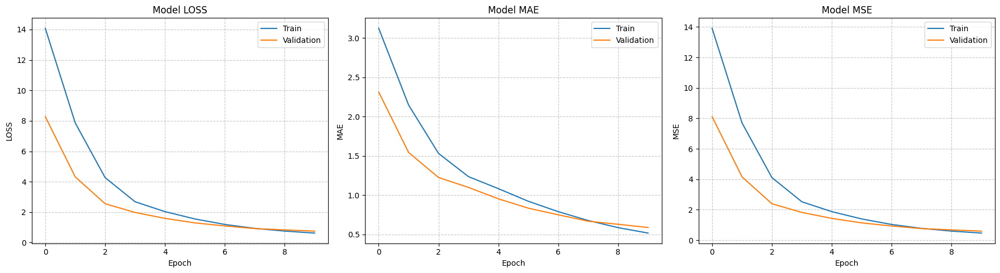


--- Final Test Set Evaluation (GW 16) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Evaluating test set performance...{'loss': 0.8263764381408691, 'mae': 0.659535825252533, 'mse': 0.6634851694107056}
R²: 0.8385592275027974
MAE: 0.6595358252525330
MSE: 0.6634851694107056
Loss: 0.8263764381408691

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

--- Results for Gameweek 16 ---
 Gameweek      Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       16       Foden       11.9         13.83      -0.37     -0.72
       16 B.Fernandes        9.6         10.30      -0.37     -0.72
       16      Rogers        8.2          8.07      -0.37     -0.72
       16     Ekitiké        6.3          7.42       2.68     -0.72
       16        Saka        7.0          7.11      -0.37     -0.72
       16       Rúben        6.5          6.83      -0.37      1.39
       16      Cherki        6.3          6.43      -0.37     -0.72
       16       Guéhi        

In [134]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 16)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_16 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_16.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_16 = model_16.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_16)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 16) ---")
test_result_16 = model_16.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_16, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_16}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_16 = model_16.predict([X_test_scaled, M_test_scaled]).flatten()


position_16 = active_data['position'][test_mask]
teams_16 = active_data['team'][test_mask]

players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_16, 'team': teams_16, 'position': position_16}
preds_df_16 = pd.DataFrame(players_preds)

# Results
results_df_16 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_16,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 16 ---")
print(results_df_16.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


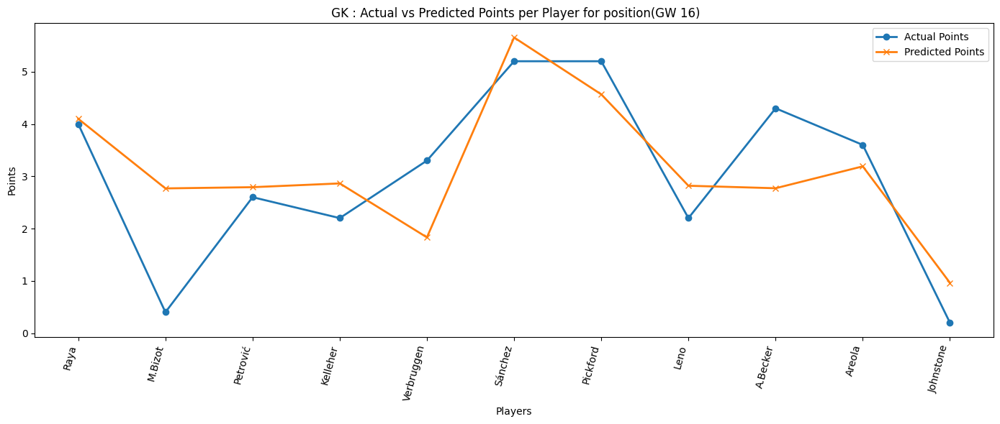

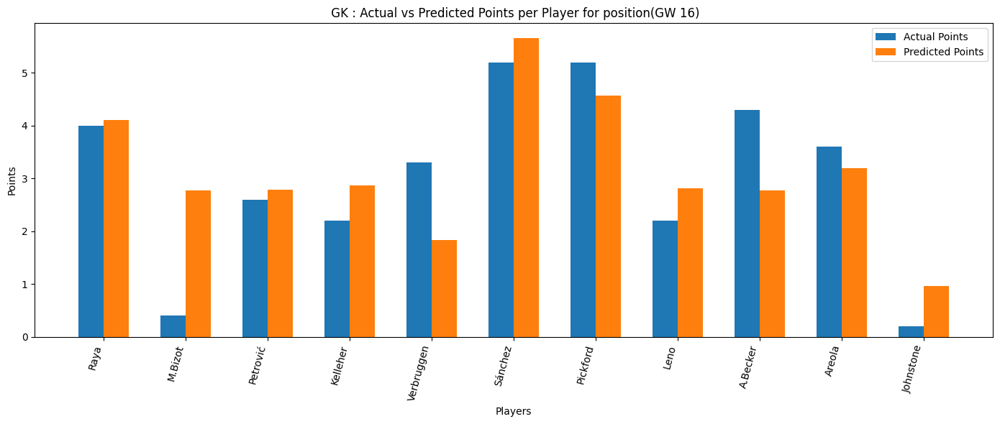

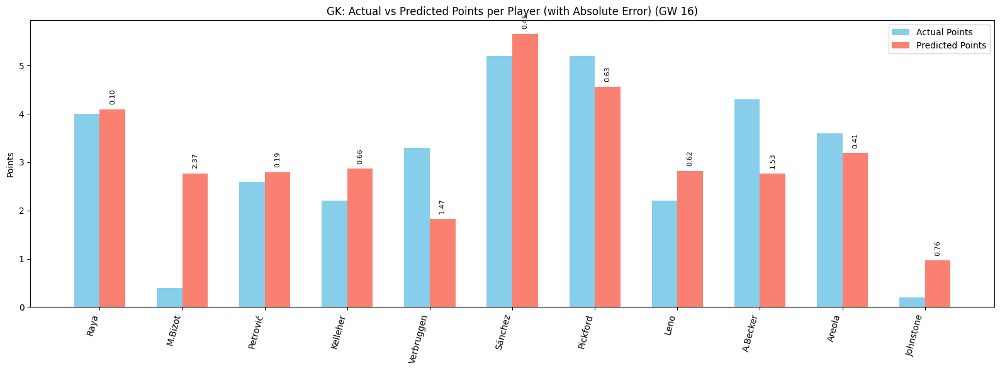

In [135]:
plot_preds(preds_df_16, 'GK', 16)


###### DEF


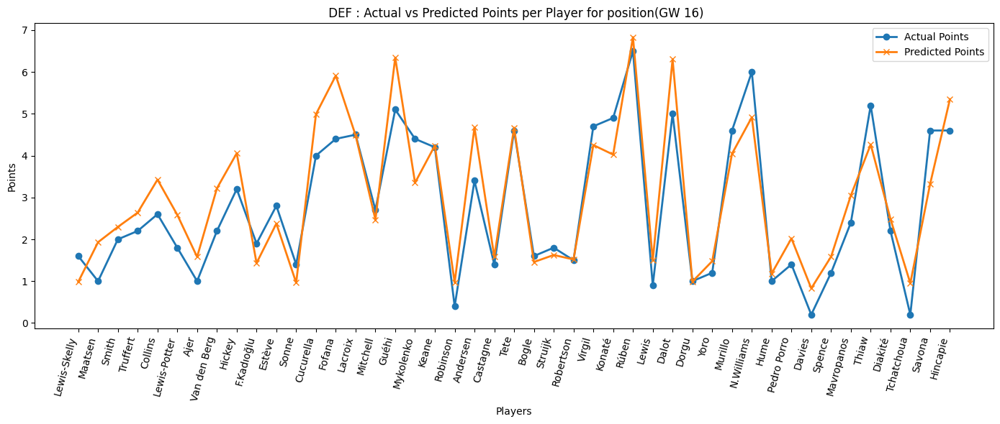

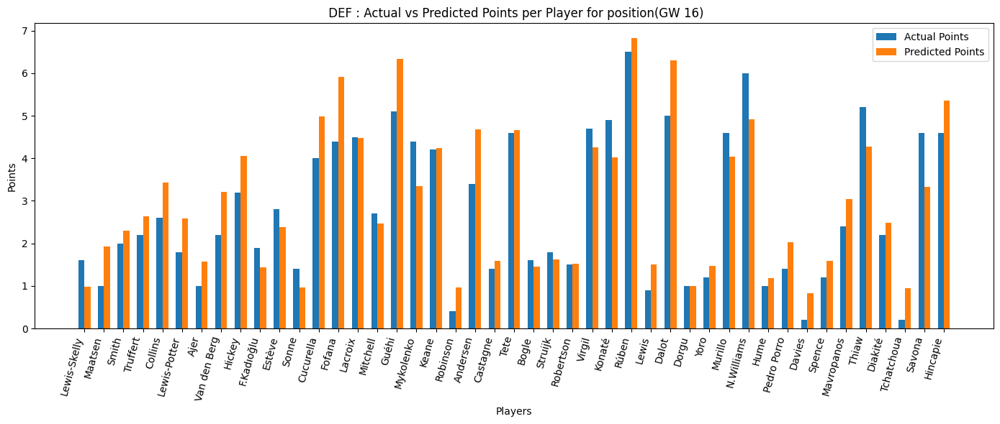

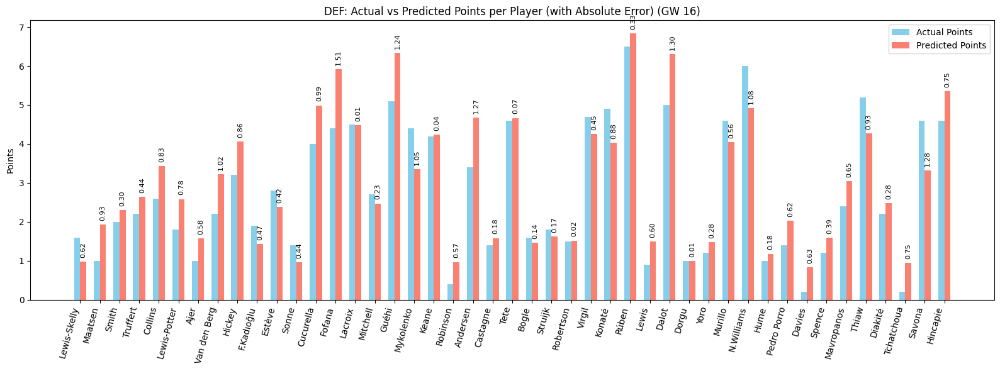

In [136]:
plot_preds(preds_df_16, 'DEF', 16)

###### MID


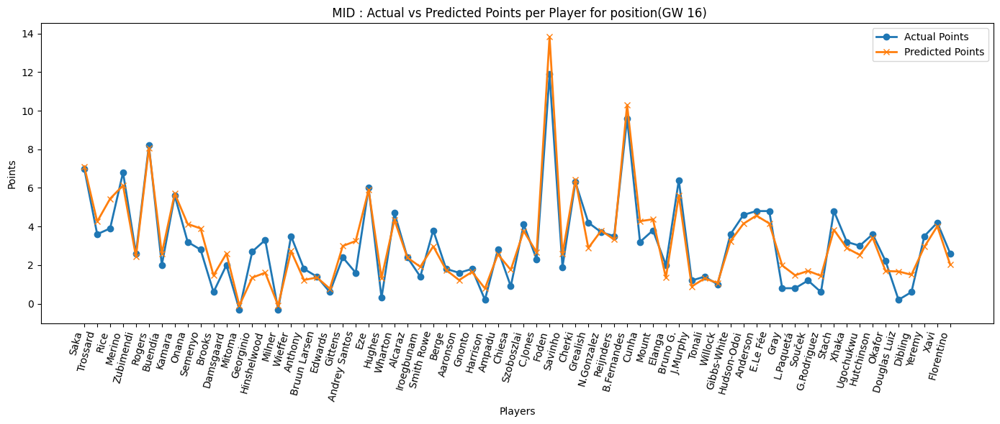

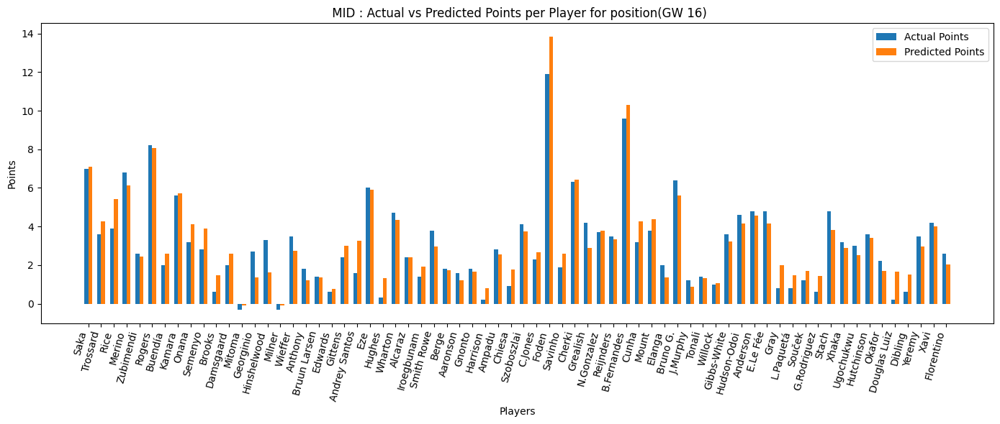

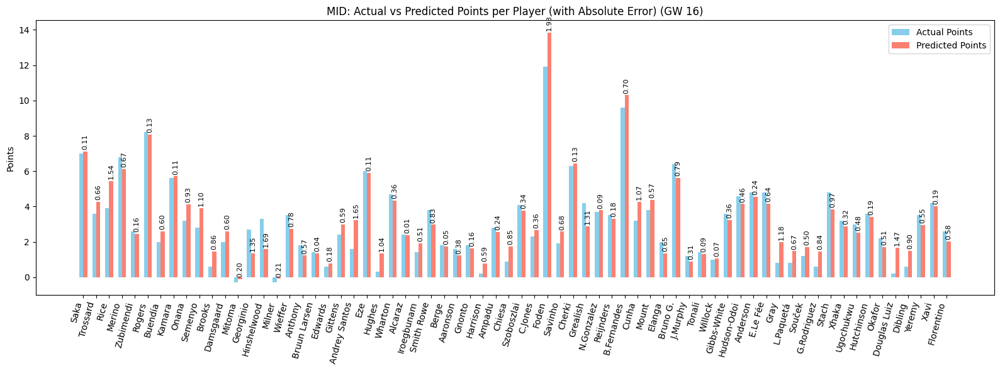

In [137]:
plot_preds(preds_df_16, 'MID', 16)

###### FWD


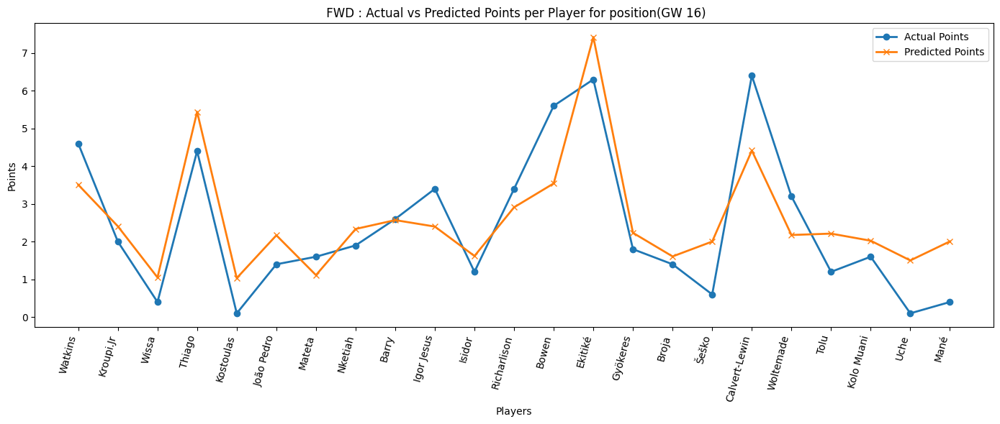

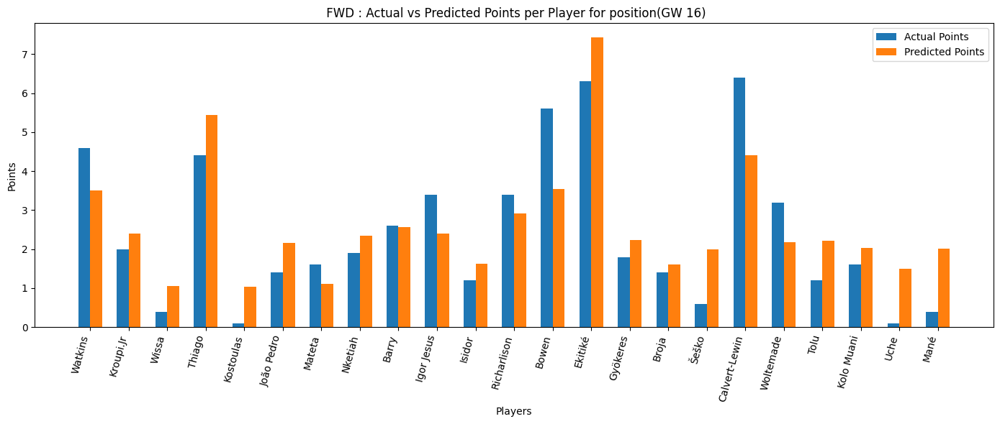

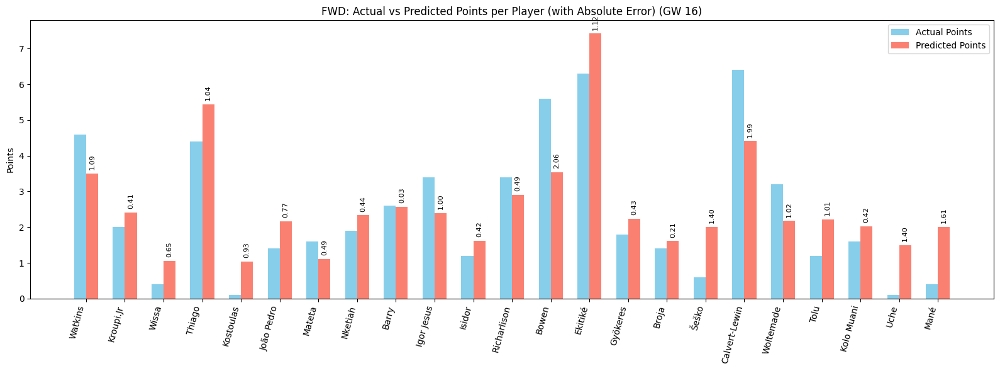

In [138]:
plot_preds(preds_df_16, 'FWD', 16)

#### Optimize


In [139]:
squad_16, total_points_16 = get_optimized_team(Y_pred_16, 16)
squad_16

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-173.1433
IRL epoch 100/200 loss=-1896.7887
IRL epoch 150/200 loss=-8143.0371
IRL epoch 200/200 loss=-22386.3828
HGAT Policy Embeddings Shape: torch.Size([147, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
            name            team position  price    xP_pred  is_captain  \
2           Saka         Arsenal      MID   10.2   7.114520       False   
93   B.Fernandes         Man Utd      MID    9.2  10.301172       False   
84         Foden        Man City      MID    8.7  13.830315        True   
9         Rogers     Aston Villa      MID    7.0   8.065822       False   
86        Cherki        Man City      MID    6.4   6.429587       False   
42       Sánchez         Chelsea       GK    4.9   5.654010       False   
123      Ekitiké       Liverpool      FWD    8.5   7.423231       False   
82         Rúben        Man City      DEF    5.6   6.831495       False   
50         Guéhi  Crystal Palace      DEF    

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Saka,Arsenal,MID,7.114520,11.0,False,False
1,Rogers,Aston Villa,MID,8.065822,15.0,False,False
2,Sánchez,Chelsea,GK,5.654010,6.0,False,False
3,Fofana,Chelsea,DEF,5.911583,9.0,False,False
4,Guéhi,Crystal Palace,DEF,6.341229,1.0,False,False
5,Rúben,Man City,DEF,6.831495,8.0,False,False
6,Foden,Man City,MID,13.830315,22.0,True,False
7,Cherki,Man City,MID,6.429587,6.0,False,False
8,Dalot,Man Utd,DEF,6.302351,2.0,False,False
9,B.Fernandes,Man Utd,MID,10.301172,19.5,False,False


### GW 17


Data prepared. X shape: (3840, 55), M shape: (3840, 4), Y shape: (3840, 2)

Starting Training...
Epoch 1/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 10.5870 - mae: 2.5259 - mse: 10.4246 - val_loss: 4.3038 - val_mae: 1.5399 - val_mse: 4.1409
Epoch 2/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6.0973 - mae: 1.8096 - mse: 5.9343 - val_loss: 2.9763 - val_mae: 1.3413 - val_mse: 2.8128
Epoch 3/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.8011 - mae: 1.4773 - mse: 3.6375 - val_loss: 2.4795 - val_mae: 1.2572 - val_mse: 2.3157
Epoch 4/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.7998 - mae: 1.2840 - mse: 2.6360 - val_loss: 1.9298 - val_mae: 1.0843 - val_mse: 1.7659
Epoch 5/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1459 - mae: 1.1068 - mse: 1.9821 - val_loss: 1.5313 - val_mae: 0.9410 - val_mse: 1.3673
Epoch 6/10
47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.5297 - mae: 0.9243 - mse: 1.3657 - val_loss: 1.2351 - val_mae: 0.8179 - val_mse: 1.0710
Epoch 7/10
47

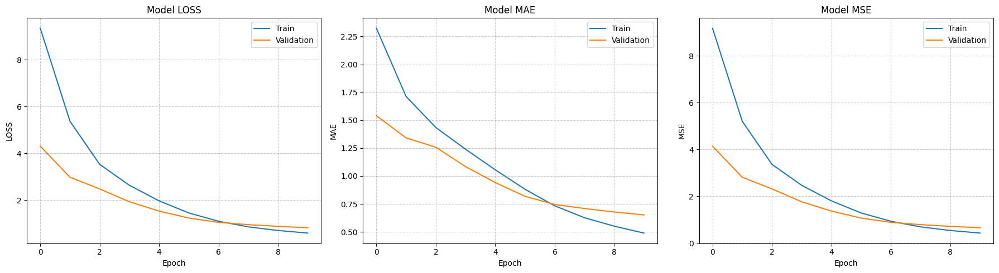


--- Final Test Set Evaluation (GW 17) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Evaluating test set performance...{'loss': 0.8007649183273315, 'mae': 0.6285020112991333, 'mse': 0.6368232369422913}
R²: 0.83998977409860931
MAE: 0.62850201129913330
MSE: 0.63682323694229126
Loss: 0.80076491832733154

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

--- Results for Gameweek 17 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       17         Foden       12.1         11.75      -0.38     -0.71
       17        Rogers        8.2          9.42      -0.38     -0.71
       17       Semenyo        4.8          6.69      -0.38     -0.71
       17 Calvert-Lewin        8.8          6.56       2.63     -0.71
       17        Cherki        5.7          6.22      -0.38     -0.71
       17         Rúben        6.3          6.18      -0.38      1.40
       17          Rice        6.2          5.86      -0.38     -0.71
       1

In [148]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 17)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_17 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_17.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_17 = model_17.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_17)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 17) ---")
test_result_17 = model_17.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_17, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_17}")
print(f"R²: {evaluation_metrics['test_R2']:.17f}")
print(f"MAE: {evaluation_metrics['test_mae']:.17f}")
print(f"MSE: {evaluation_metrics['test_mse']:.17f}")
print(f"Loss: {evaluation_metrics['test_loss']:.17f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_17 = model_17.predict([X_test_scaled, M_test_scaled]).flatten()


position_17 = active_data['position'][test_mask]
teams_17 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_17, 'team': teams_17, 'position': position_17}
preds_df_17 = pd.DataFrame(players_preds)

# Results
results_df_17 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_17,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 17 ---")
print(results_df_17.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


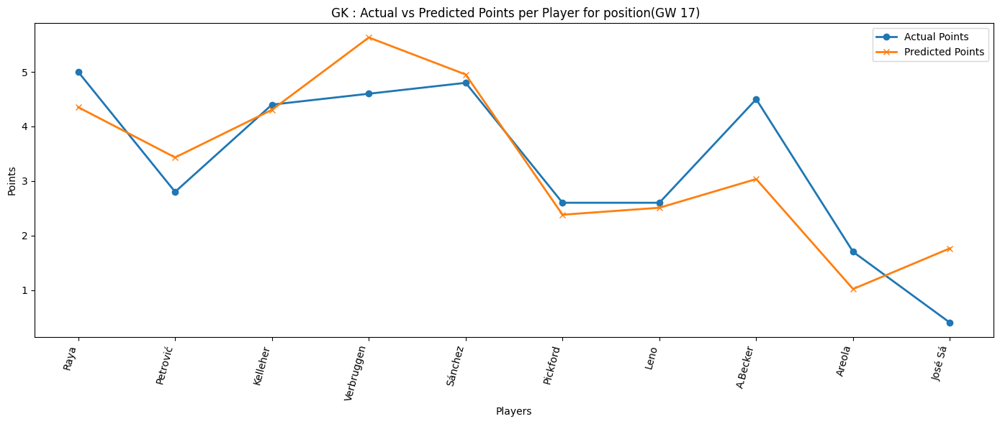

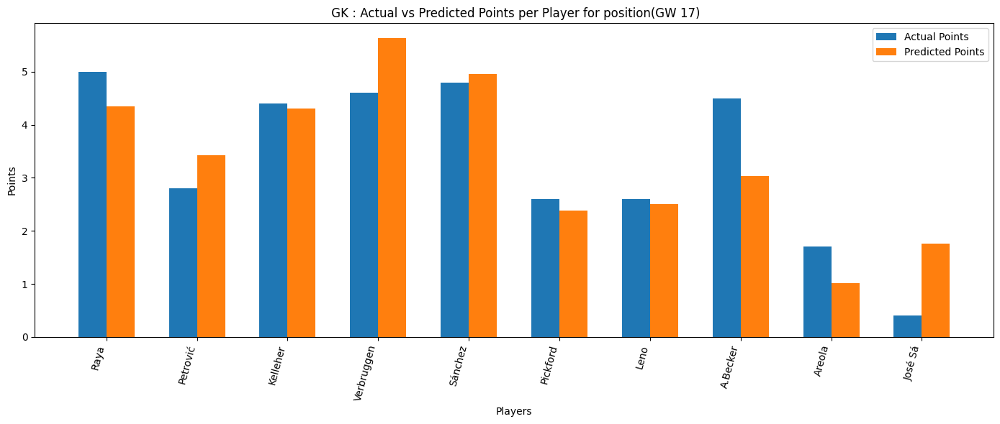

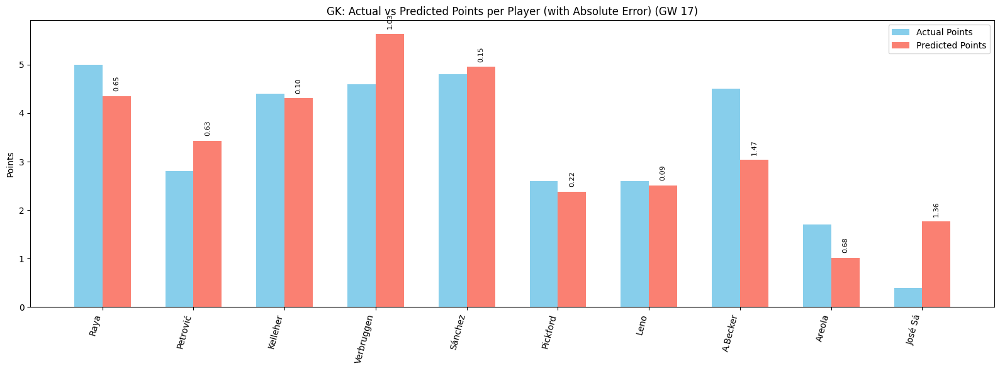

In [149]:
plot_preds(preds_df_17, 'GK', 17)


###### DEF


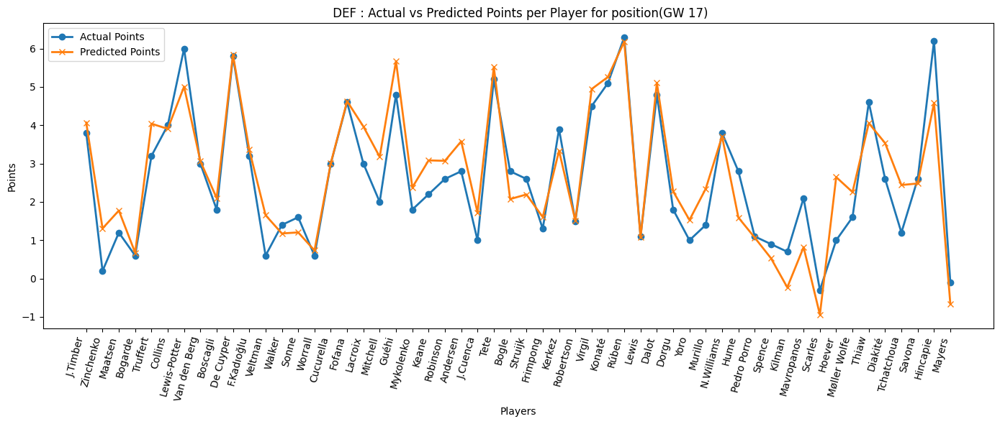

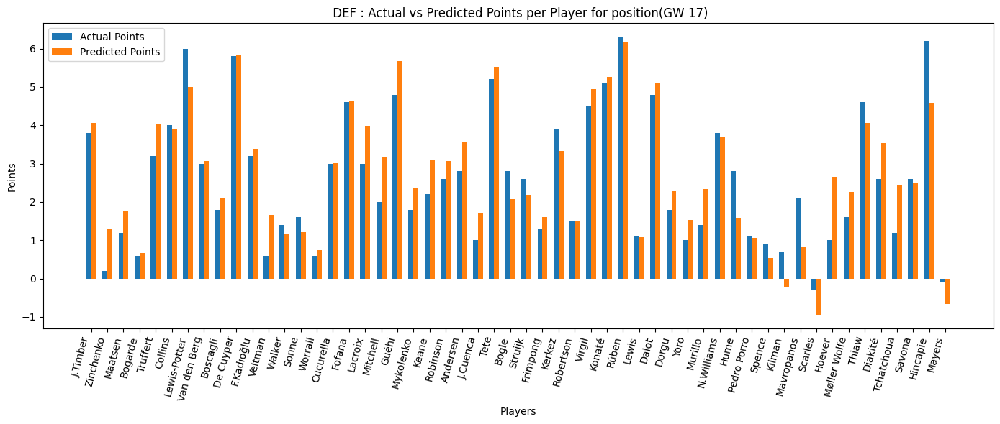

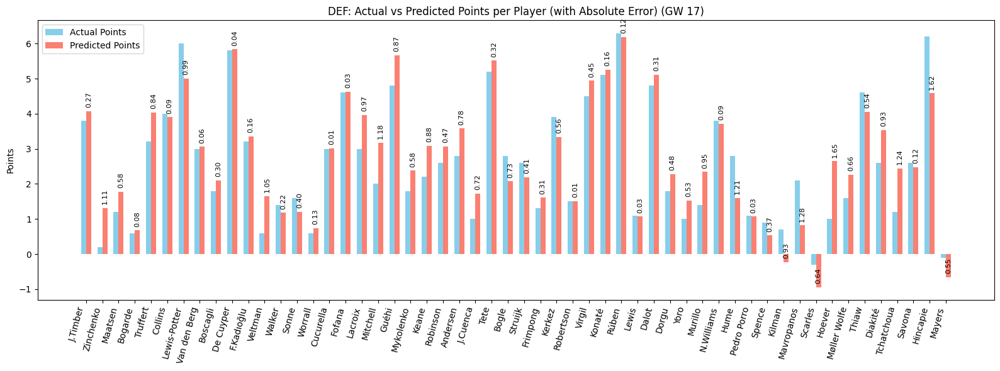

In [150]:
plot_preds(preds_df_17, 'DEF', 17)

###### MID


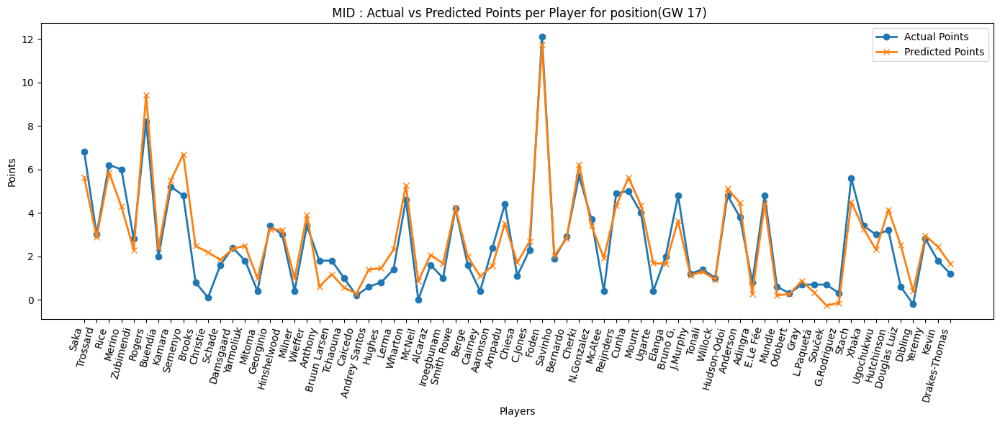

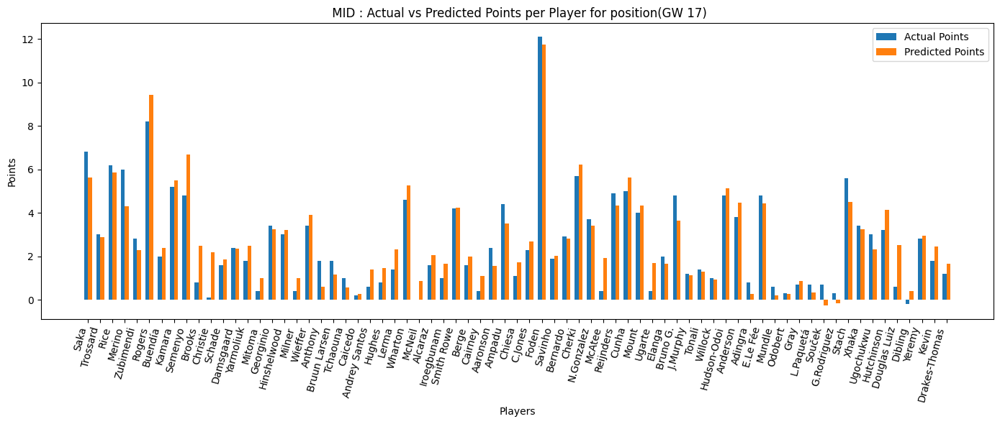

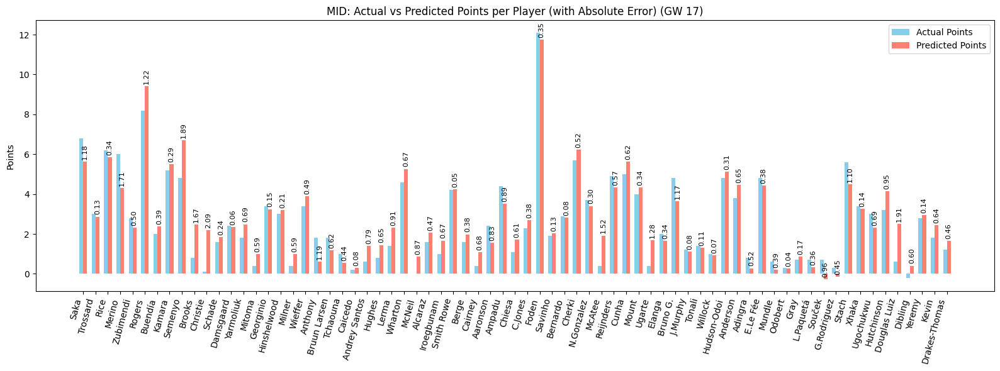

In [151]:
plot_preds(preds_df_17, 'MID', 17)

###### FWD


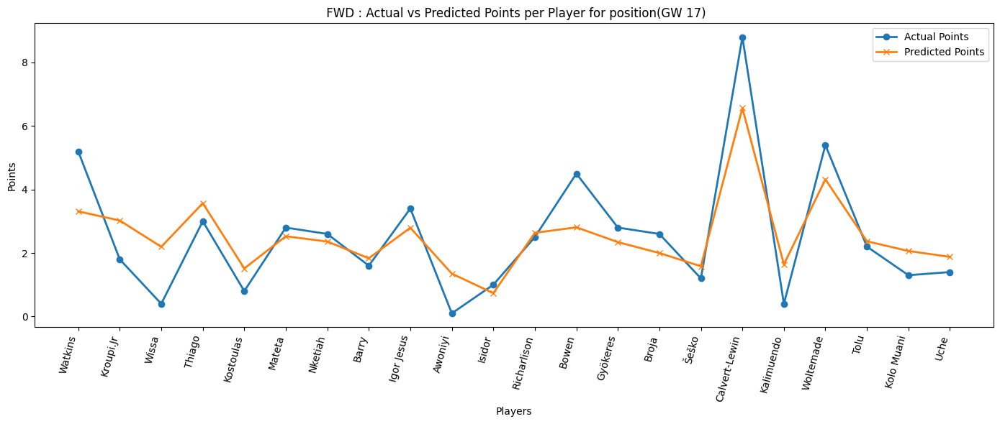

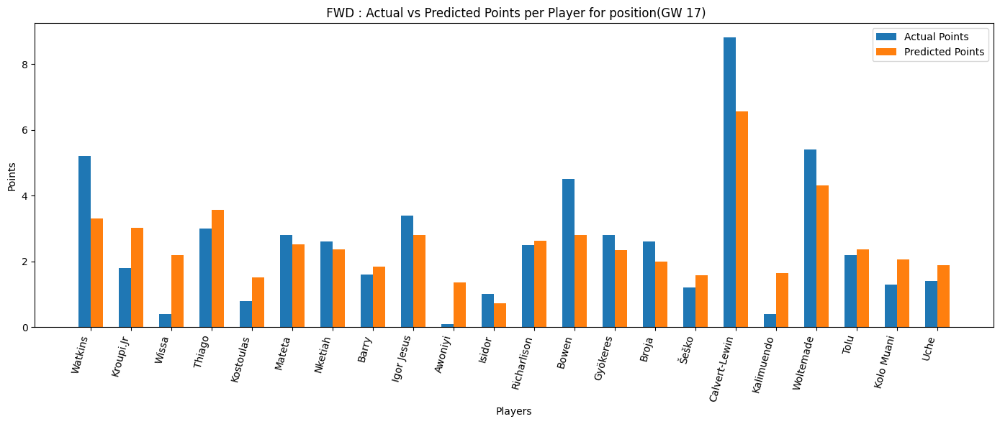

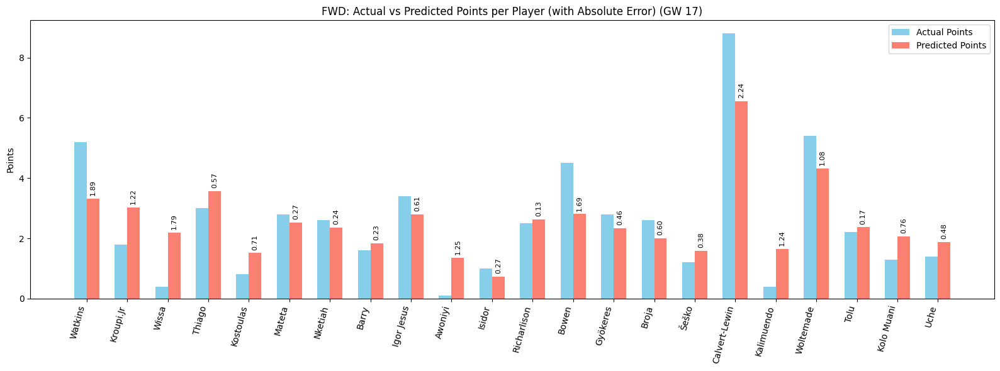

In [152]:
plot_preds(preds_df_17, 'FWD', 17)

#### Optimize


In [153]:
squad_17, total_points_17 = get_optimized_team(Y_pred_17, 17)
squad_17

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-270.6502
IRL epoch 100/200 loss=-3031.0820


IRL epoch 150/200 loss=-12991.7754
IRL epoch 200/200 loss=-35676.3359
HGAT Policy Embeddings Shape: torch.Size([157, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
              name            team position  price    xP_pred  is_captain  \
88           Foden        Man City      MID    8.9  11.747428        True   
16         Semenyo     Bournemouth      MID    7.6   6.691020       False   
5             Rice         Arsenal      MID    7.1   5.858846       False   
10          Rogers     Aston Villa      MID    7.1   9.417655       False   
91          Cherki        Man City      MID    6.5   6.219455       False   
29      Verbruggen        Brighton       GK    4.4   5.631511       False   
141  Calvert-Lewin           Leeds      FWD    5.7   6.561787       False   
86           Rúben        Man City      DEF    5.7   6.182667       False   
53           Guéhi  Crystal Palace      DEF    5.3   5.672096       False   
70            Tete          Fulham      DEF    4.5   5.51935

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Rice,Arsenal,MID,5.858846,11.0,False,False
1,Rogers,Aston Villa,MID,9.417655,22.5,False,False
2,Semenyo,Bournemouth,MID,6.691020,10.0,False,False
3,Verbruggen,Brighton,GK,5.631511,11.0,False,False
4,De Cuyper,Brighton,DEF,5.841058,6.0,False,False
5,Guéhi,Crystal Palace,DEF,5.672096,1.0,False,False
6,Tete,Fulham,DEF,5.519353,9.0,False,False
7,Rúben,Man City,DEF,6.182667,6.0,False,False
8,Foden,Man City,MID,11.747428,6.0,True,False
9,Cherki,Man City,MID,6.219455,4.0,False,False


### GW 18


Data prepared. X shape: (6661, 212), M shape: (6661, 3), Y shape: (6661, 2)

Starting Training...
Epoch 1/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 12.7070 - mae: 2.8018 - mse: 12.4635 - val_loss: 2.9068 - val_mae: 1.2683 - val_mse: 2.6630
Epoch 2/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.7124 - mae: 1.4327 - mse: 3.4688 - val_loss: 2.1228 - val_mae: 1.0691 - val_mse: 1.8794
Epoch 3/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1112 - mae: 1.0800 - mse: 1.8678 - val_loss: 1.4739 - val_mae: 0.8607 - val_mse: 1.2307
Epoch 4/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2937 - mae: 0.8068 - mse: 1.0506 - val_loss: 1.1033 - val_mae: 0.6988 - val_mse: 0.8604
Epoch 5/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8998 - mae: 0.6219 - mse: 0.6570 - val_loss: 0.9157 - val_mae: 0.6149 - val_mse: 0.6733
Epoch 6/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7306 - mae: 0.5311 - mse: 0.4884 - val_loss: 0.7995 - val_mae: 0.5604 - val_mse: 0.5578
Epoch 7/10
8

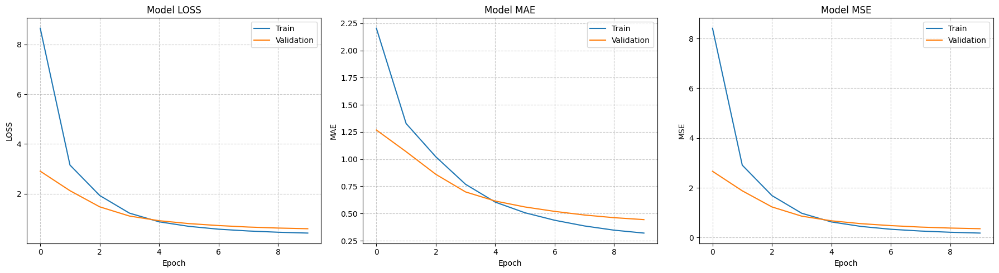


--- Final Test Set Evaluation (GW 18) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Evaluating test set performance...{'loss': 0.4910986125469208, 'mae': 0.38031867146492004, 'mse': 0.2538965940475464}
R²: 0.924733150598556208
MAE: 0.380318671464920044
MSE: 0.253896594047546387
Loss: 0.491098612546920776

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

--- Results for Gameweek 18 ---
 Gameweek        Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       18         Foden        9.5          8.74       1.08     -1.23
       18       Haaland        9.9          8.58       1.08     -1.23
       18       Ekitiké        7.5          7.84       1.62     -2.18
       18 Calvert-Lewin        9.0          7.50       0.03      0.30
       18        Cherki        7.5          7.06       1.08     -1.23
       18        Rogers        7.0          7.02      -0.81      0.80
       18      Gvardiol        7.3          6.74       1.08     -1.23

In [20]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 18)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_18 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_18.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_18 = model_18.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_18)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 18) ---")
test_result_18 = model_18.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_18, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_18}")
print(f"R²: {evaluation_metrics['test_R2']:.18f}")
print(f"MAE: {evaluation_metrics['test_mae']:.18f}")
print(f"MSE: {evaluation_metrics['test_mse']:.18f}")
print(f"Loss: {evaluation_metrics['test_loss']:.18f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_18 = model_18.predict([X_test_scaled, M_test_scaled]).flatten()


position_18 = active_data['position'][test_mask]
teams_18 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_18, 'team': teams_18, 'position': position_18}
preds_df_18 = pd.DataFrame(players_preds)

# Results
results_df_18 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_18,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 18 ---")
print(results_df_18.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


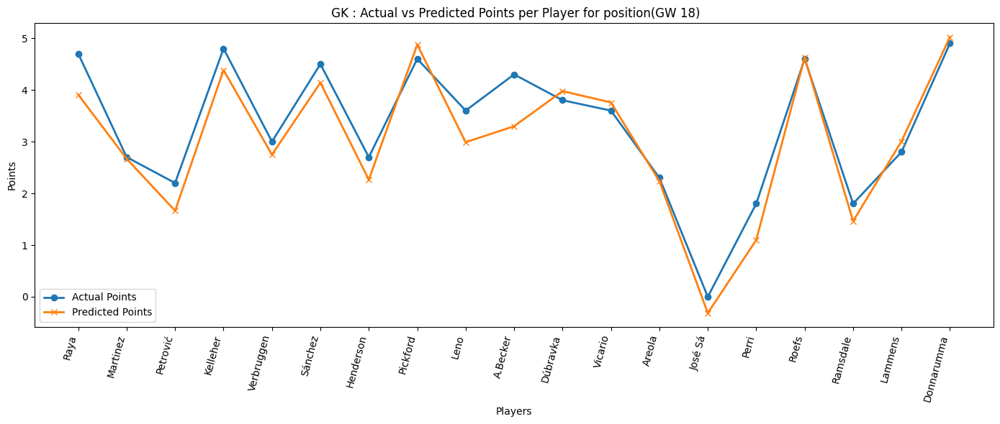

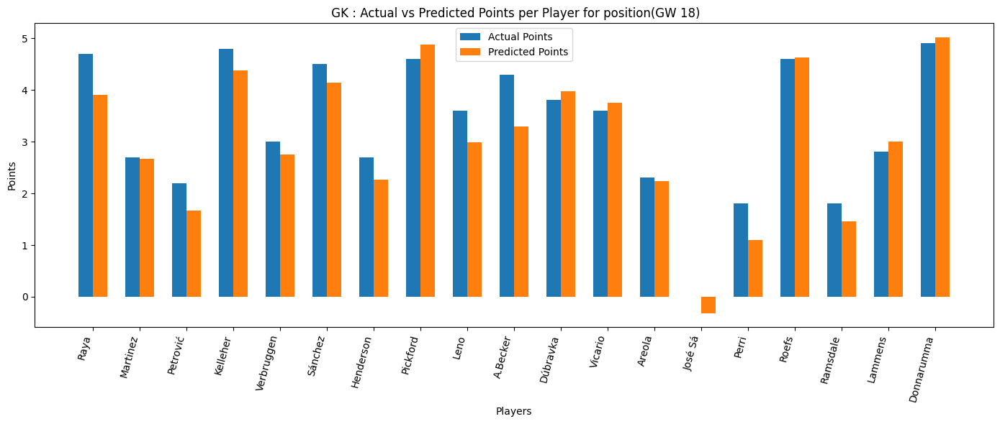

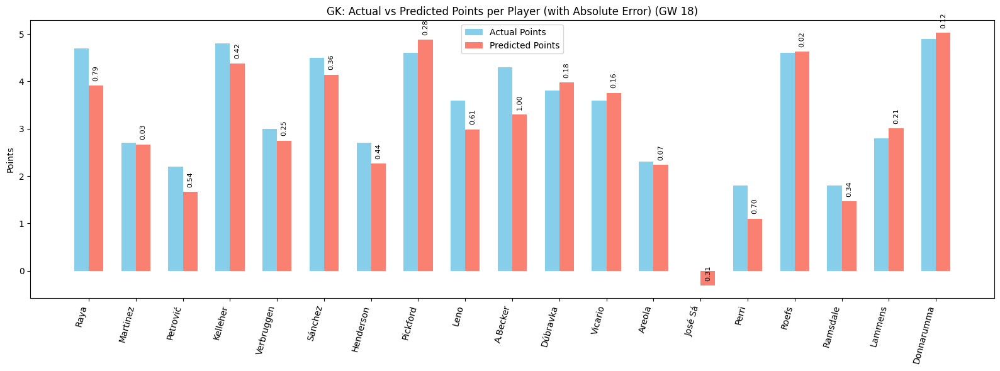

In [75]:
plot_preds(preds_df_18, 'GK', 18)


###### DEF


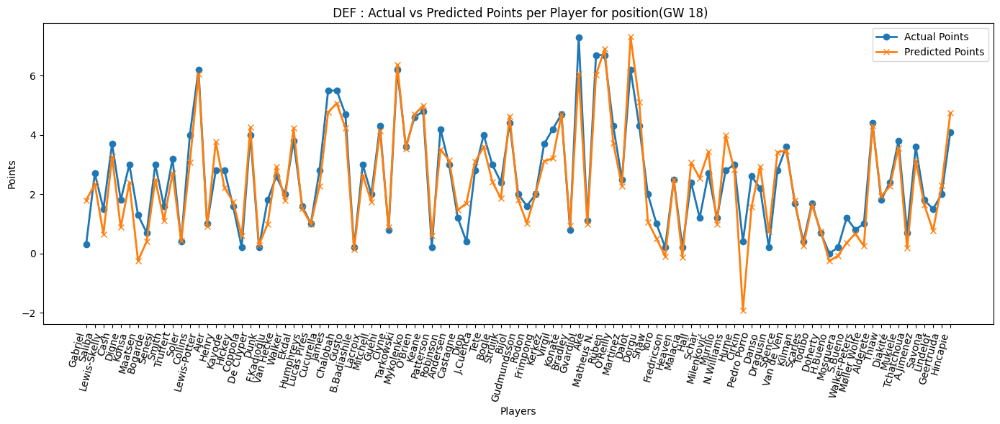

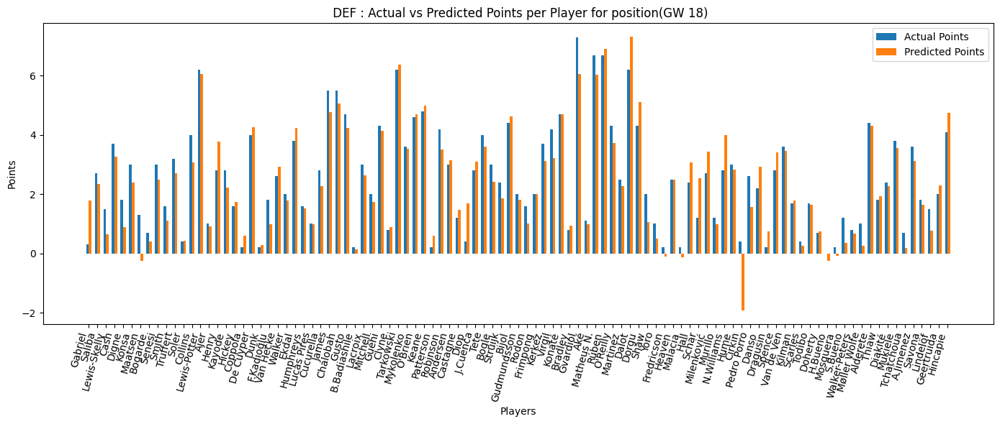

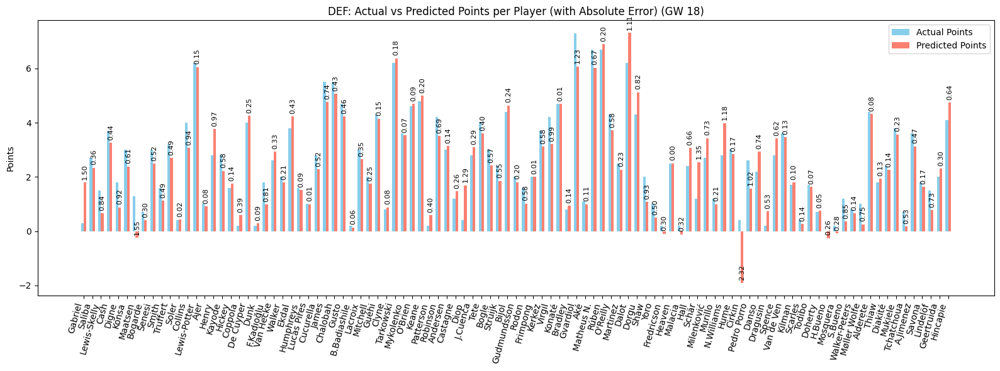

In [76]:
plot_preds(preds_df_18, 'DEF', 18)

###### MID


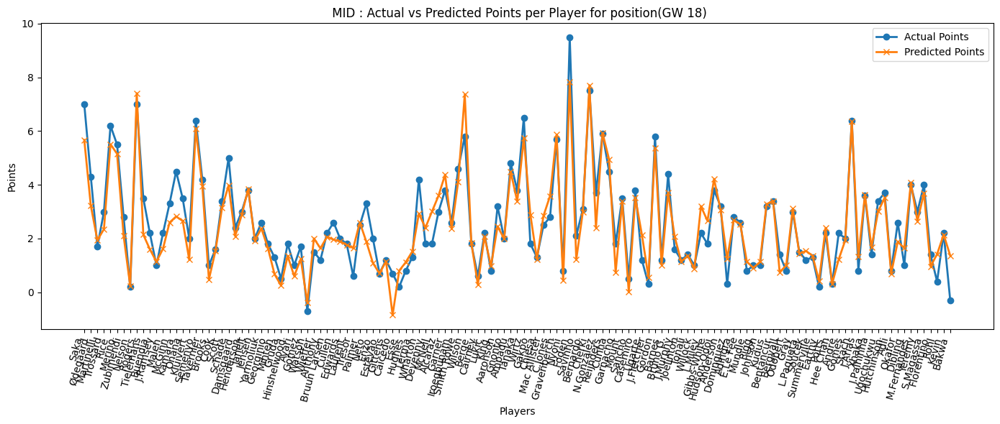

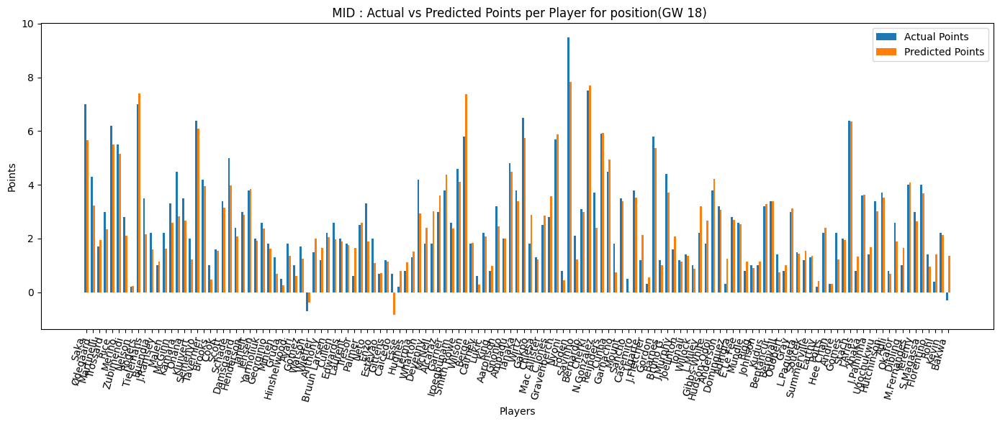

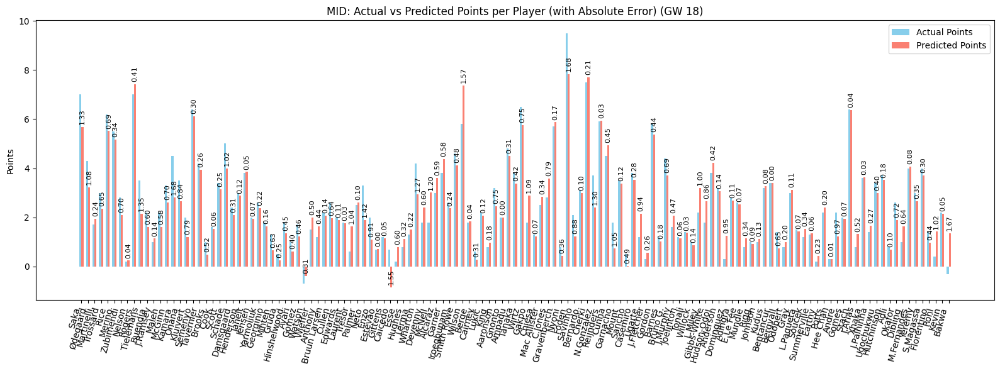

In [77]:
plot_preds(preds_df_18, 'MID', 18)

###### FWD


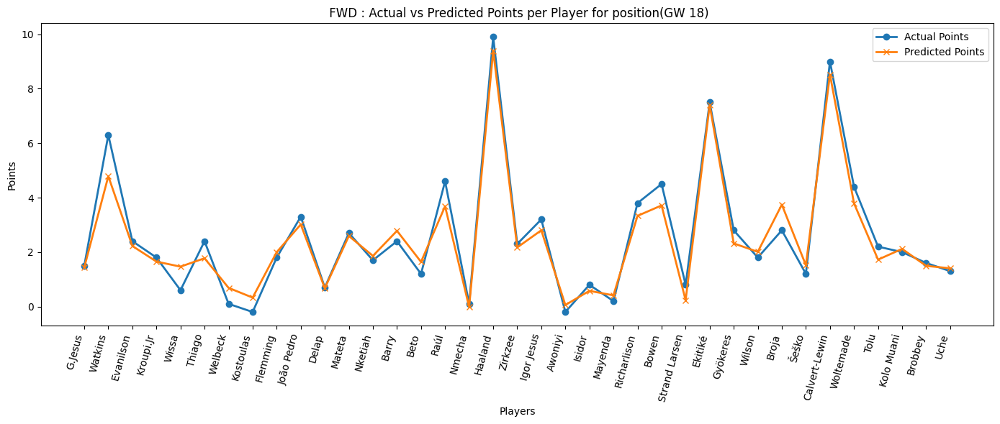

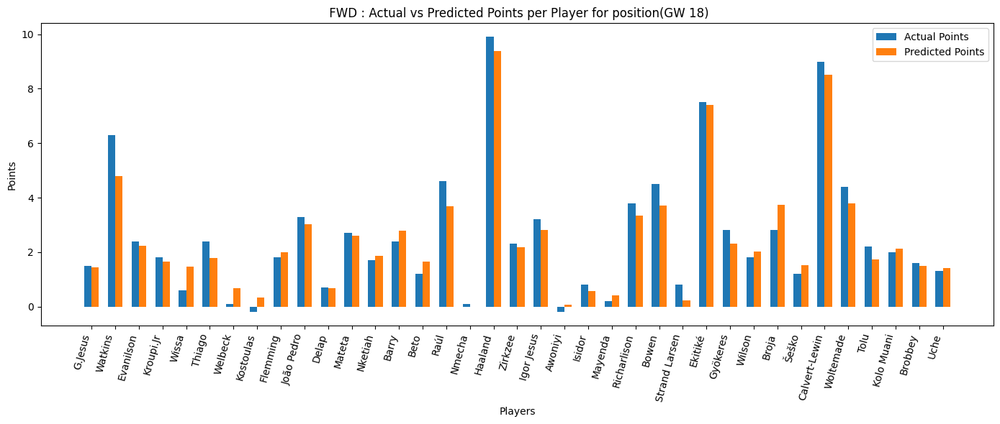

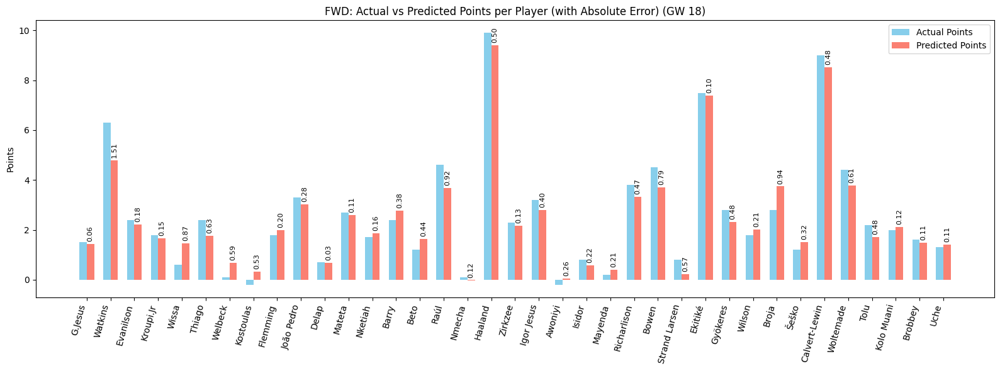

In [78]:
plot_preds(preds_df_18, 'FWD', 18)

#### Optimize


In [79]:
squad_18, total_points_18 = get_optimized_team(Y_pred_18, 18)
squad_18

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-181.1158
IRL epoch 100/200 loss=-2050.0872
IRL epoch 150/200 loss=-8833.9912
IRL epoch 200/200 loss=-24308.3027
HGAT Policy Embeddings Shape: torch.Size([290, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
              name         team position  price   xP_pred  is_captain  is_vice
163          Foden     Man City      MID    9.0  7.818770       False    False
19          Rogers  Aston Villa      MID    7.3  7.411474       False    False
166         Cherki     Man City      MID    6.6  7.709549       False     True
129         Wilson       Fulham      MID    5.8  7.370684       False    False
109       Pickford      Everton       GK    5.5  4.875240       False    False
169        Haaland     Man City      FWD   15.1  9.397434        True    False
248        Ekitiké    Liverpool      FWD    9.0  7.396040       False    False
264  Calvert-Lewin        Leeds      FWD    5.8  8.521152       False    False
110      

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Rogers,Aston Villa,MID,7.411474,1.0,False,False
1,Lewis-Potter,Brentford,DEF,6.050735,2.0,False,False
2,Pickford,Everton,GK,4.875240,6.0,False,False
3,Tarkowski,Everton,DEF,6.377234,8.0,False,False
4,Wilson,Fulham,MID,7.370684,5.0,False,False
5,Foden,Man City,MID,7.818770,2.0,False,False
6,Cherki,Man City,MID,7.709549,13.0,False,True
7,Haaland,Man City,FWD,9.397434,4.0,True,False
8,Dalot,Man Utd,DEF,7.311542,13.0,False,False
9,Ekitiké,Liverpool,FWD,7.396040,5.0,False,False


### GW 19


Data prepared. X shape: (6661, 212), M shape: (6661, 3), Y shape: (6661, 2)

Starting Training...
Epoch 1/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 8.6551 - mae: 2.2414 - mse: 8.4088 - val_loss: 2.7439 - val_mae: 1.2304 - val_mse: 2.4972
Epoch 2/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.2520 - mae: 1.3529 - mse: 3.0053 - val_loss: 2.0038 - val_mae: 1.0314 - val_mse: 1.7572
Epoch 3/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0782 - mae: 1.0695 - mse: 1.8317 - val_loss: 1.4167 - val_mae: 0.8472 - val_mse: 1.1701
Epoch 4/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2875 - mae: 0.7990 - mse: 1.0409 - val_loss: 1.0172 - val_mae: 0.6848 - val_mse: 0.7707
Epoch 5/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.9677 - mae: 0.6446 - mse: 0.7212 - val_loss: 0.8054 - val_mae: 0.5784 - val_mse: 0.5592
Epoch 6/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.7347 - mae: 0.5333 - mse: 0.4886 - val_loss: 0.7102 - val_mae: 0.5257 - val_mse: 0.4645
Epoch 7/10
84

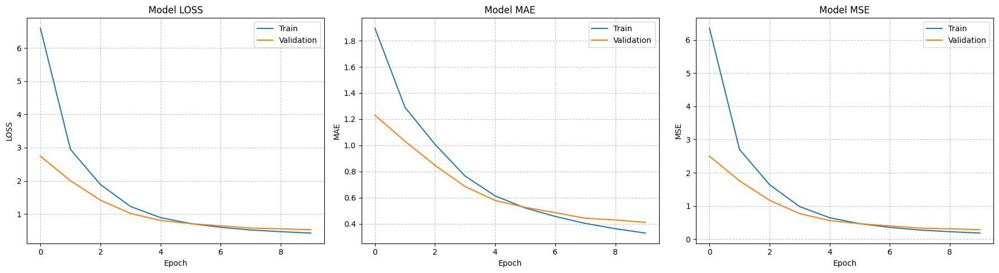


--- Final Test Set Evaluation (GW 19) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Evaluating test set performance...{'loss': 0.6082161068916321, 'mae': 0.4550969898700714, 'mse': 0.36555057764053345}
R²: 0.8955164125287707888
MAE: 0.4550969898700714111
MSE: 0.3655505776405334473
Loss: 0.6082161068916320801

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

--- Results for Gameweek 19 ---
 Gameweek     Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       19     Cherki        8.5          8.57       1.46     -1.75
       19      Dalot        6.2          8.24       1.50     -1.88
       19 Matheus N.        8.5          8.17       1.46     -1.75
       19    Haaland        7.5          7.77       1.46     -1.75
       19      Rúben        7.9          7.50       1.46     -1.75
       19    Semenyo        6.6          7.27      -1.49      1.22
       19    Ekitiké        8.9          7.18       1.19     -1.39
       19       Sak

In [21]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 19)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_19 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_19.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_19 = model_19.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_19)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 19) ---")
test_result_19 = model_19.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_19, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_19}")
print(f"R²: {evaluation_metrics['test_R2']:.19f}")
print(f"MAE: {evaluation_metrics['test_mae']:.19f}")
print(f"MSE: {evaluation_metrics['test_mse']:.19f}")
print(f"Loss: {evaluation_metrics['test_loss']:.19f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_19 = model_19.predict([X_test_scaled, M_test_scaled]).flatten()


position_19 = active_data['position'][test_mask]
teams_19 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_19, 'team': teams_19, 'position': position_19}
preds_df_19 = pd.DataFrame(players_preds)

# Results
results_df_19 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_19,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 19 ---")
print(results_df_19.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


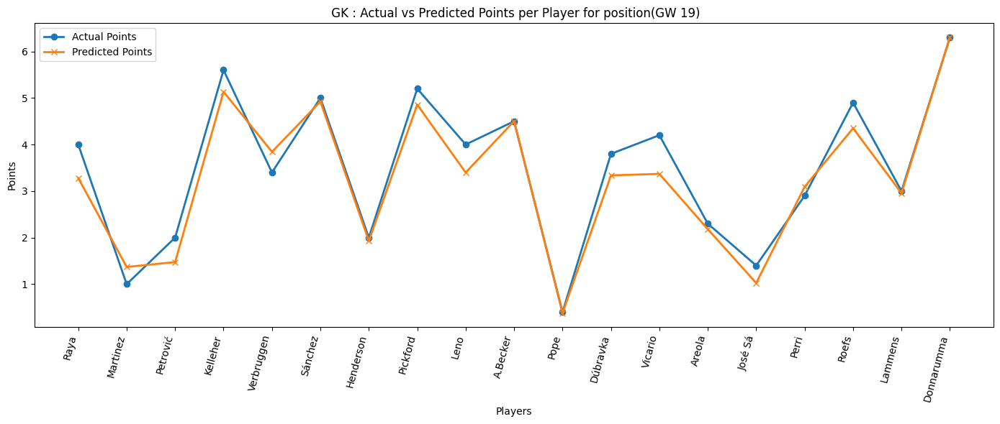

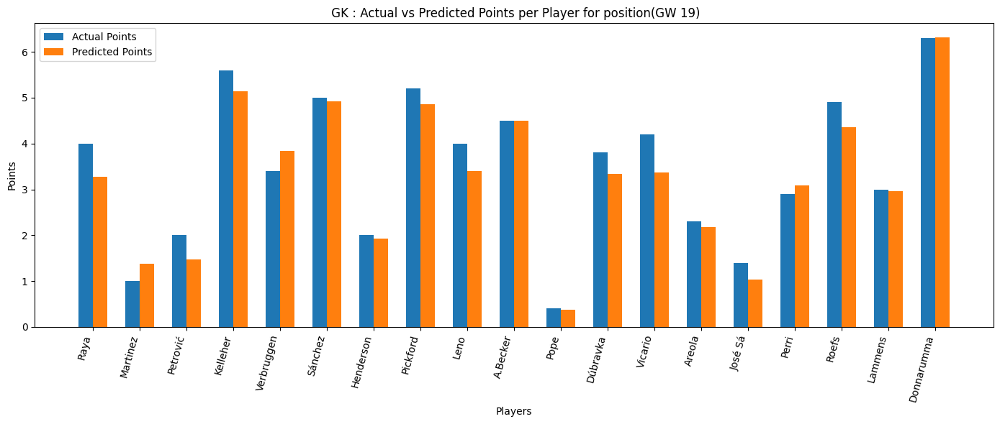

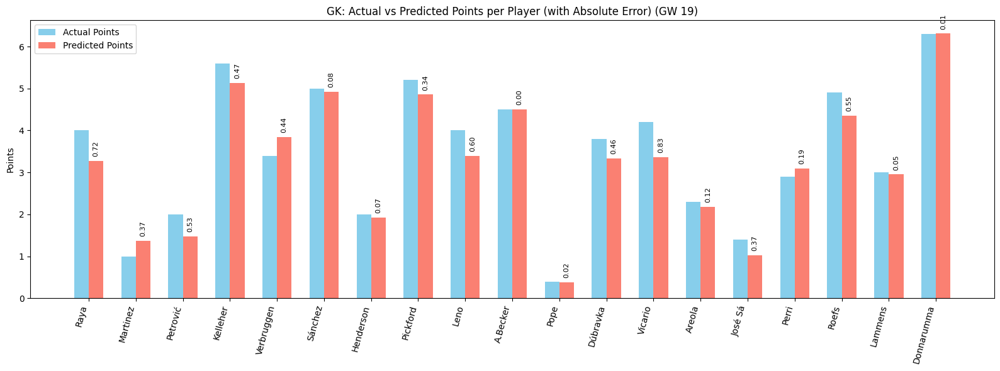

In [81]:
plot_preds(preds_df_19, 'GK', 19)


###### DEF


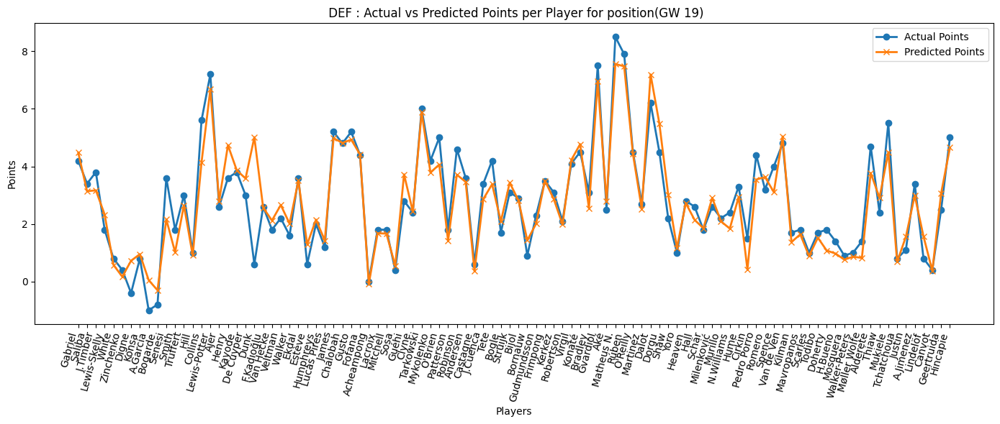

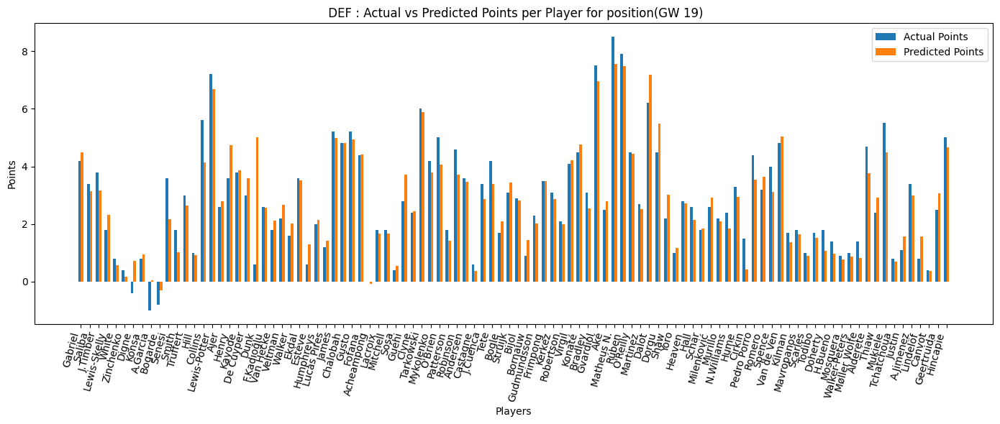

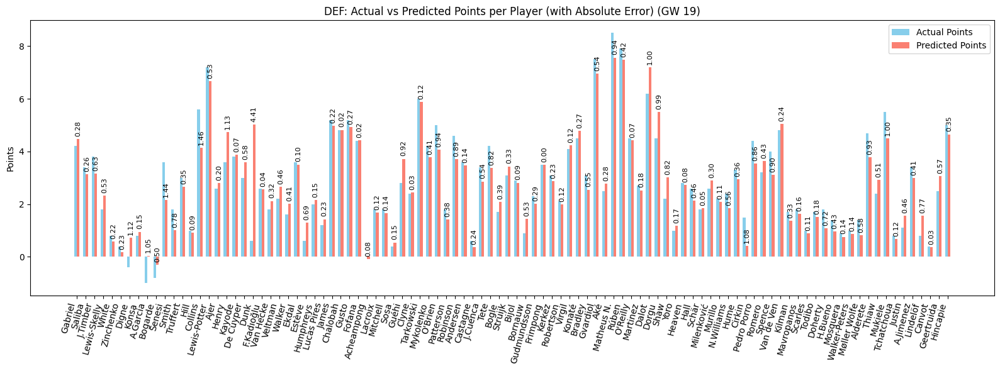

In [82]:
plot_preds(preds_df_19, 'DEF', 19)

###### MID


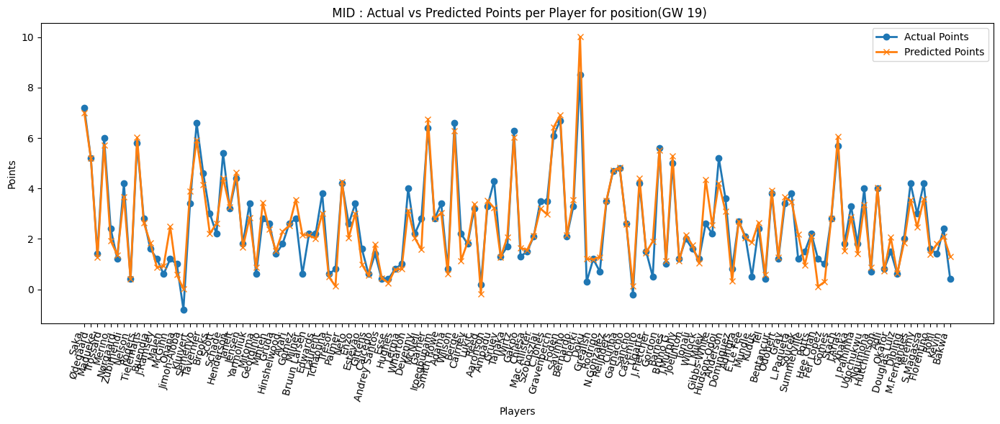

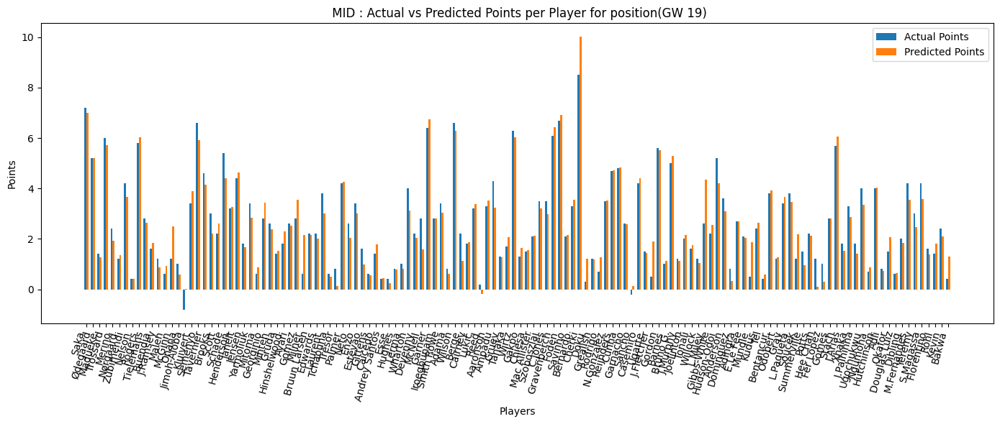

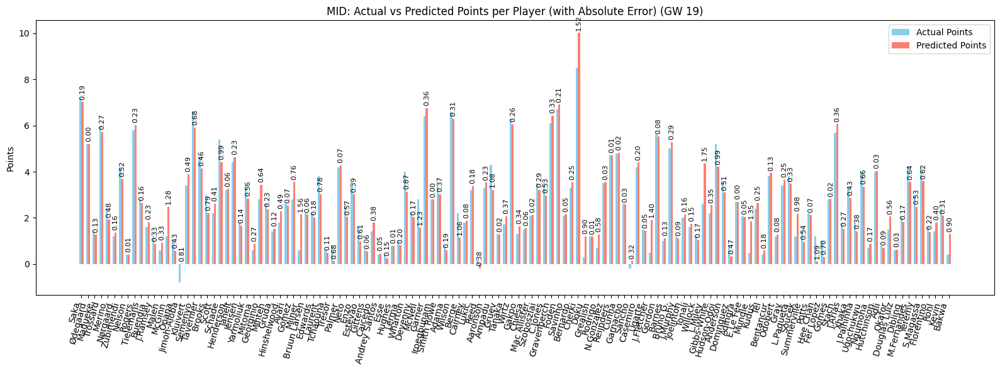

In [83]:
plot_preds(preds_df_19, 'MID', 19)

###### FWD


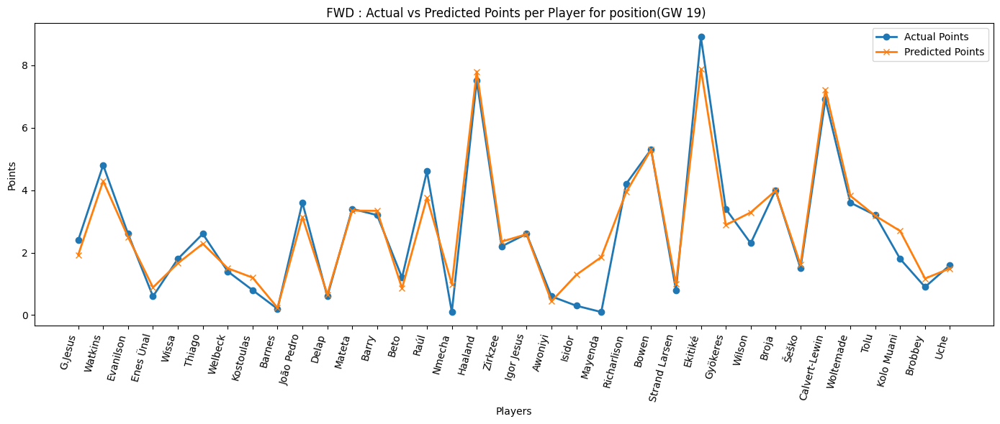

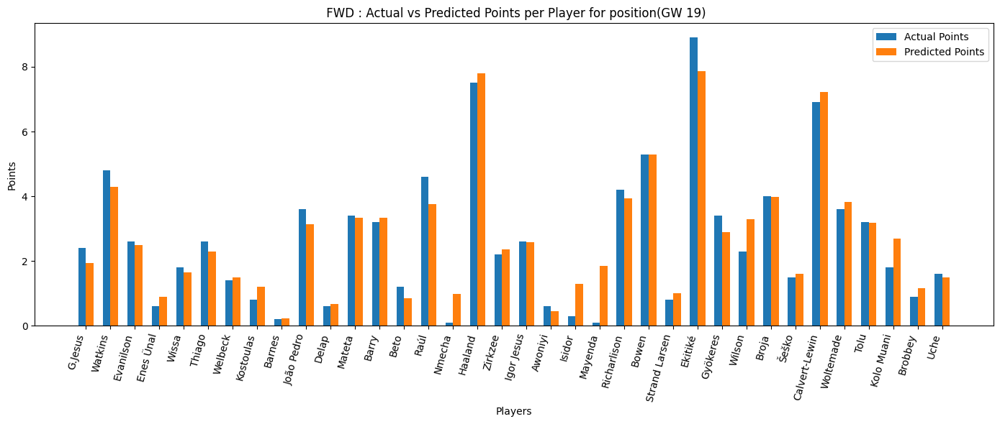

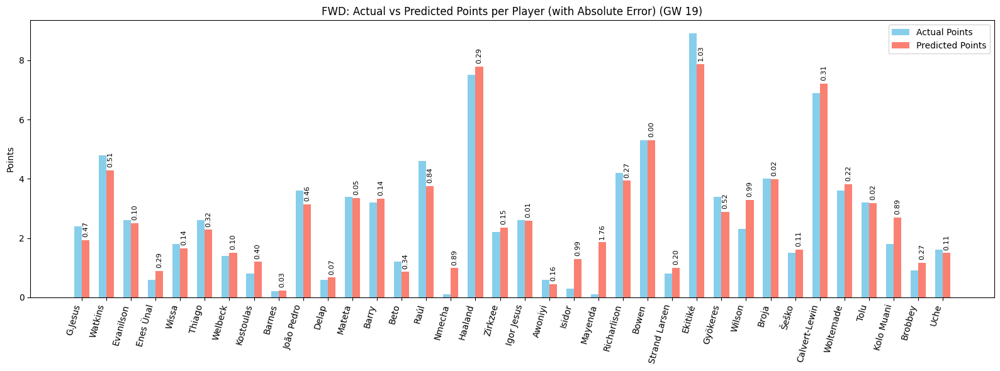

In [84]:
plot_preds(preds_df_19, 'FWD', 19)

#### Optimize


In [85]:
squad_19, total_points_19 = get_optimized_team(Y_pred_19, 19)
squad_19

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-247.3776
IRL epoch 100/200 loss=-2587.7332
IRL epoch 150/200 loss=-10856.9297
IRL epoch 200/200 loss=-29541.7383
HGAT Policy Embeddings Shape: torch.Size([287, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
              name       team position  price    xP_pred  is_captain  is_vice
7             Saka    Arsenal      MID   10.3   7.012432       False    False
165         Cherki   Man City      MID    6.7  10.015559        True    False
156    Gravenberch  Liverpool      MID    5.7   6.426651       False    False
115         Garner    Everton      MID    5.0   6.757552       False    False
42        Kelleher  Brentford       GK    4.5   5.134565       False    False
171        Haaland   Man City      FWD   15.1   7.791520       False    False
244        Ekitiké  Liverpool      FWD    9.1   7.871867       False    False
259  Calvert-Lewin      Leeds      FWD    5.8   7.214387       False    False
159     Matheus N

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Saka,Arsenal,MID,7.012432,6.0,False,False
1,Kelleher,Brentford,GK,5.134565,6.0,False,False
2,Lewis-Potter,Brentford,DEF,6.674396,6.0,False,True
3,Garner,Everton,MID,6.757552,16.0,False,False
4,Gravenberch,Liverpool,MID,6.426651,5.0,False,False
5,Matheus N.,Man City,DEF,7.559342,11.0,False,False
6,Cherki,Man City,MID,10.015559,10.0,True,False
7,Haaland,Man City,FWD,7.791520,2.0,False,False
8,Dalot,Man Utd,DEF,7.195209,2.0,False,False
9,Ekitiké,Liverpool,FWD,7.871867,3.0,False,False


### GW 20


Data prepared. X shape: (6754, 212), M shape: (6754, 3), Y shape: (6754, 2)

Starting Training...
Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 12.6521 - mae: 2.8476 - mse: 12.4085 - val_loss: 2.9251 - val_mae: 1.2840 - val_mse: 2.6816
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 3.6453 - mae: 1.4351 - mse: 3.4019 - val_loss: 2.0468 - val_mae: 1.0613 - val_mse: 1.8040
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 2.2144 - mae: 1.1047 - mse: 1.9717 - val_loss: 1.4795 - val_mae: 0.8776 - val_mse: 1.2372
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5706 - mae: 0.9070 - mse: 1.3285 - val_loss: 1.0967 - val_mae: 0.7219 - val_mse: 0.8550
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.0455 - mae: 0.6993 - mse: 0.8039 - val_loss: 0.8642 - val_mae: 0.6110 - val_mse: 0.6231
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.8255 - mae: 0.5805 - mse: 0.5846 - val_loss: 0.7390 - val_mae: 0.5407 - val_mse: 0.4986
Epoch 7/10
8

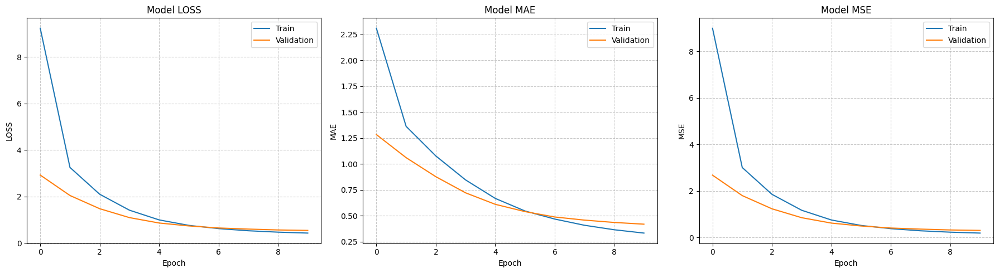


--- Final Test Set Evaluation (GW 20) ---

Evaluating test set performance...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Evaluating test set performance...{'loss': 0.634276270866394, 'mae': 0.43955278396606445, 'mse': 0.39761459827423096}
R²: 0.87133622793744436308
MAE: 0.43955278396606445312
MSE: 0.39761459827423095703
Loss: 0.63427627086639404297

Generating Predictions...
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

--- Results for Gameweek 20 ---
 Gameweek       Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       20         Rice        4.0          8.91       1.31     -1.55
       20   Matheus N.        7.5          8.13       0.94     -1.19
       20       Rogers        7.4          8.00       0.93     -0.92
       20      Haaland        7.5          7.82       0.94     -1.19
       20    Reijnders        6.5          7.56       0.94     -1.19
       20      Gabriel        6.0          7.54       1.31     -1.55
       20         Saka        7.2          7.45       1.31     -1.55

In [39]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 20)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_20 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_20.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_20 = model_20.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_20)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 20) ---")
test_result_20 = model_20.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_20, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_20}")
print(f"R²: {evaluation_metrics['test_R2']:.20f}")
print(f"MAE: {evaluation_metrics['test_mae']:.20f}")
print(f"MSE: {evaluation_metrics['test_mse']:.20f}")
print(f"Loss: {evaluation_metrics['test_loss']:.20f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_20 = model_20.predict([X_test_scaled, M_test_scaled]).flatten()


position_20 = active_data['position'][test_mask]
teams_20 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_20, 'team': teams_20, 'position': position_20}
preds_df_20 = pd.DataFrame(players_preds)

# Results
results_df_20 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_20,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 20 ---")
print(results_df_20.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


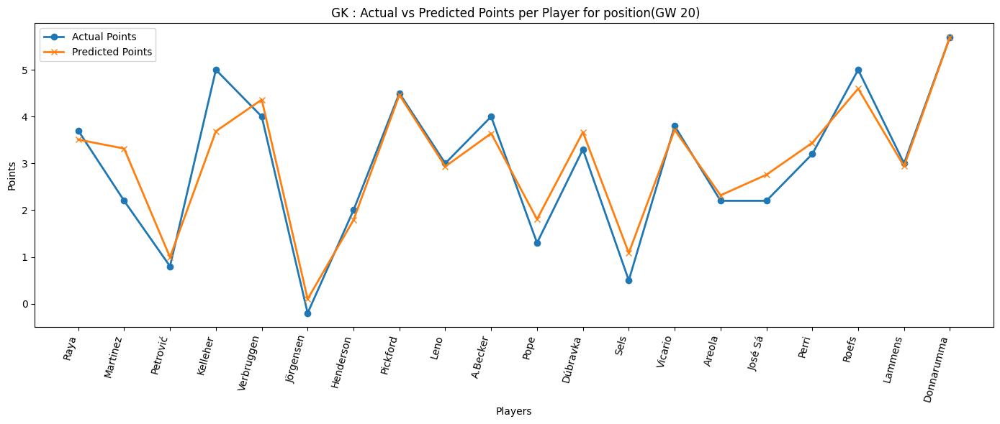

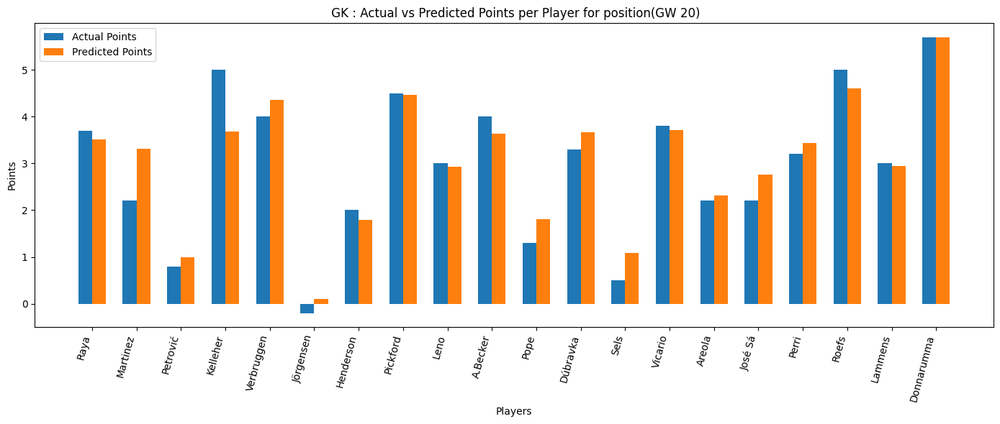

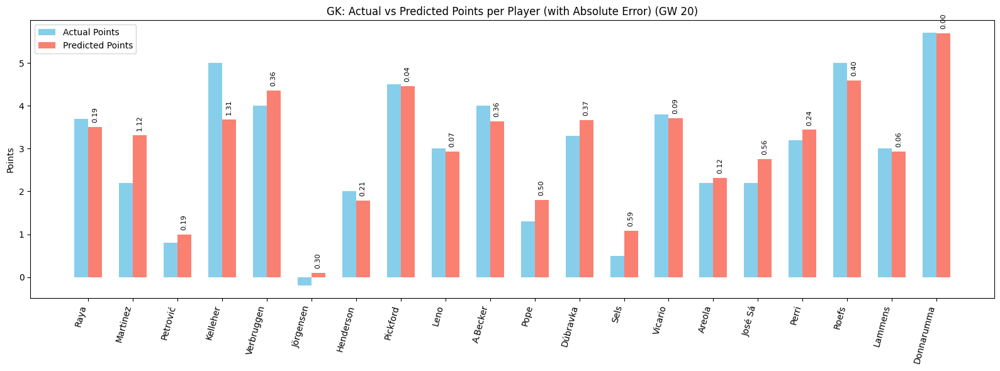

In [87]:
plot_preds(preds_df_20, 'GK', 20)


###### DEF


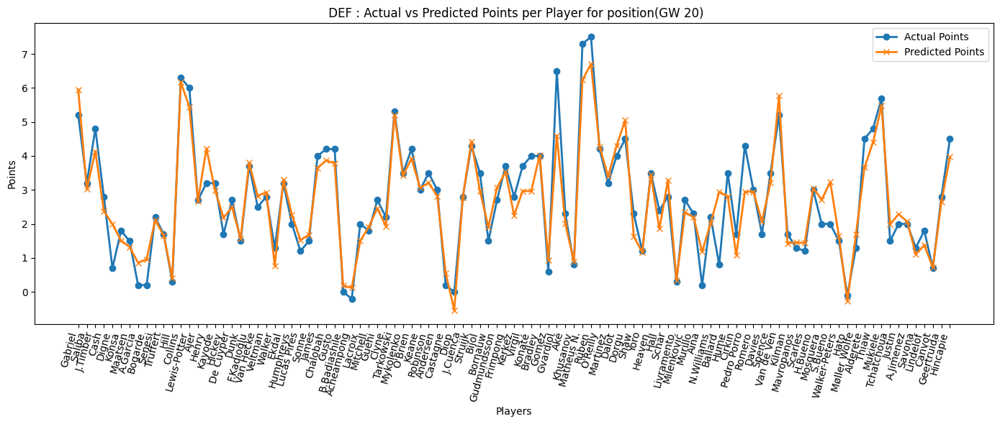

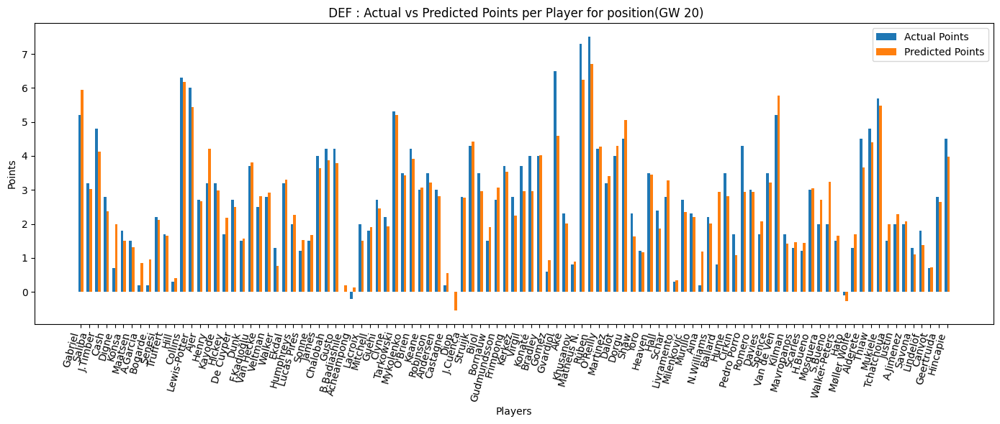

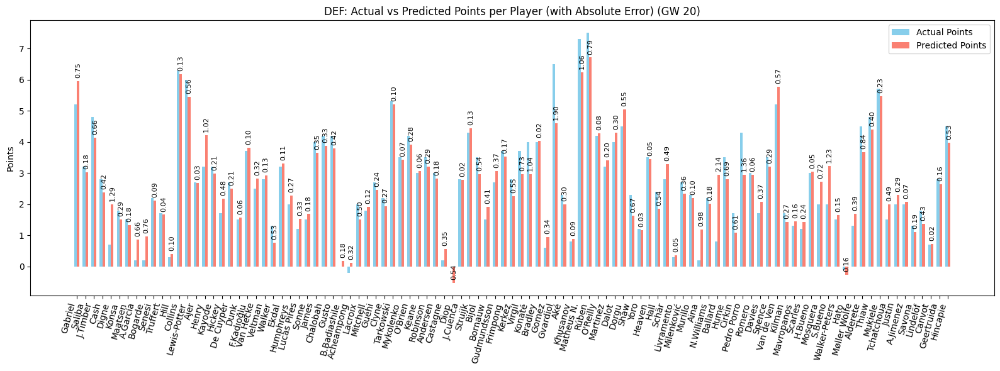

In [88]:
plot_preds(preds_df_20, 'DEF', 20)

###### MID


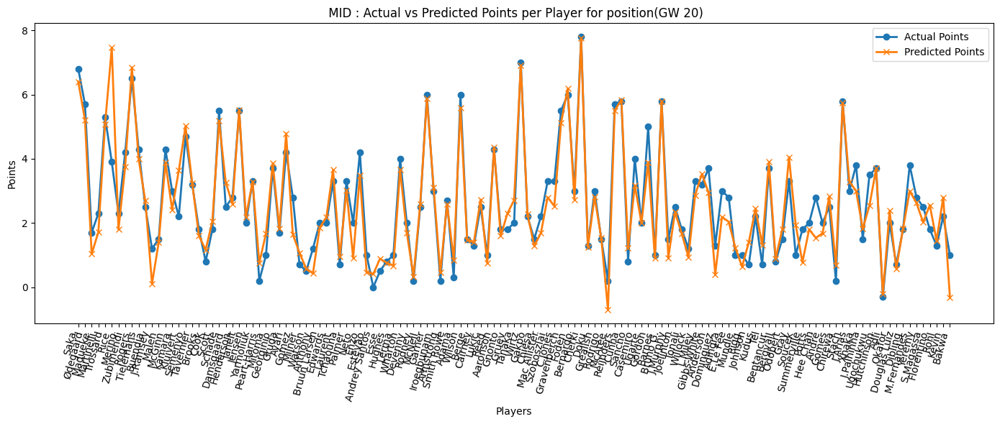

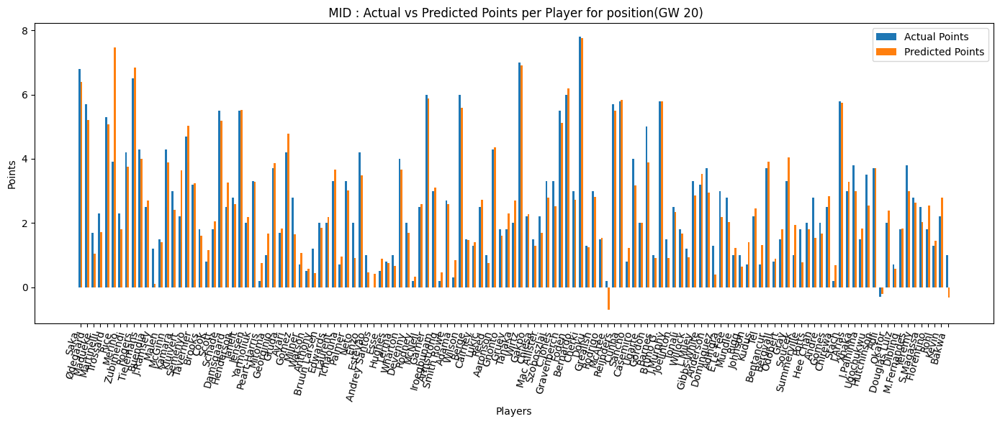

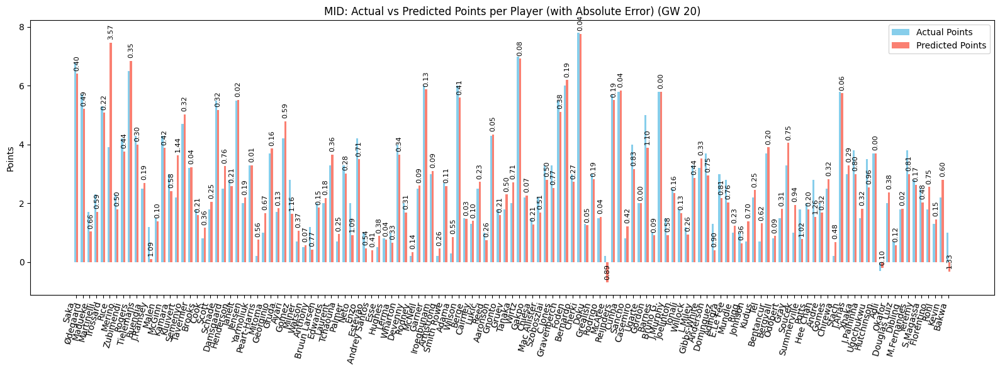

In [89]:
plot_preds(preds_df_20, 'MID', 20)

###### FWD


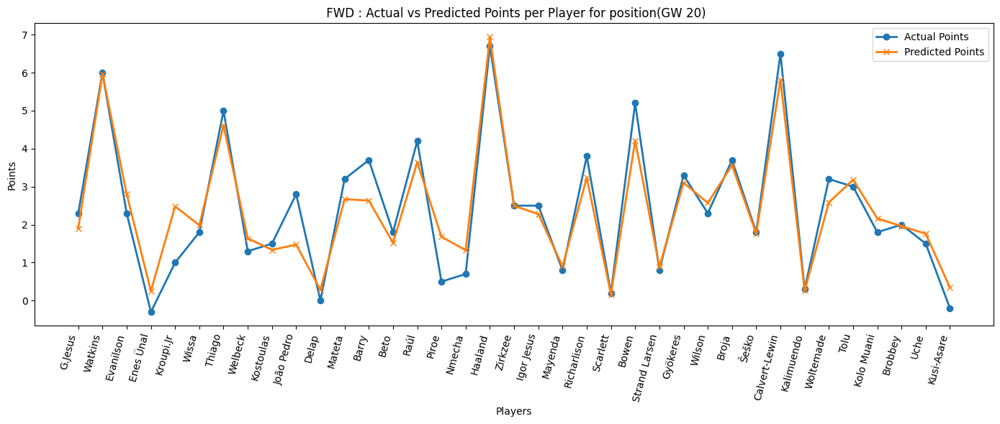

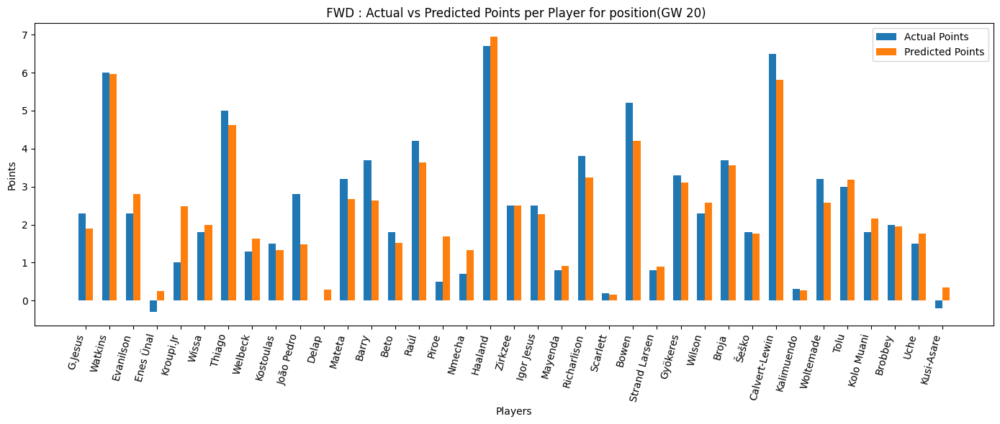

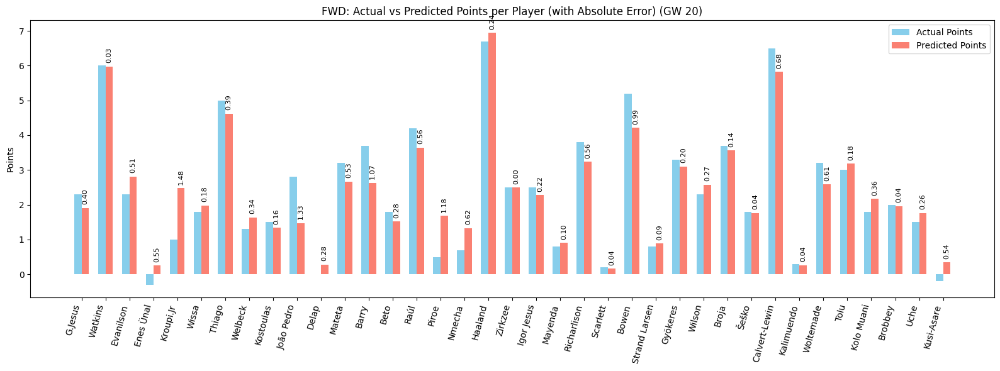

In [90]:
plot_preds(preds_df_20, 'FWD', 20)

#### Optimize


In [40]:
squad_20, total_points_20 = get_optimized_team(Y_pred_20, 20)
squad_20

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-240.1695
IRL epoch 100/200 loss=-2676.4626
IRL epoch 150/200 loss=-11424.8682
IRL epoch 200/200 loss=-31302.0137
HGAT Policy Embeddings Shape: torch.Size([294, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
             name         team position  price   xP_pred  is_captain  is_vice
4            Saka      Arsenal      MID   10.3  7.452253       False     True
20         Rogers  Aston Villa      MID    7.5  8.001976       False    False
9            Rice      Arsenal      MID    7.1  8.909495        True    False
168     Reijnders     Man City      MID    5.2  7.561552       False    False
51         Janelt    Brentford      MID    4.9  6.869849       False    False
249         Roefs   Sunderland       GK    4.8  5.673124       False    False
169       Haaland     Man City      FWD   15.1  7.823606       False    False
1         Gabriel      Arsenal      DEF    6.5  7.544922       False    False
158    Matheus N.

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Gabriel,Arsenal,DEF,7.544922,9.0,False,False
1,Saka,Arsenal,MID,7.452253,4.0,False,True
2,Rice,Arsenal,MID,8.909495,34.0,True,False
3,Rogers,Aston Villa,MID,8.001976,5.0,False,False
4,Collins,Brentford,DEF,7.417240,10.0,False,False
5,Lewis-Potter,Brentford,DEF,7.297050,0.0,False,False
6,Janelt,Brentford,MID,6.869849,11.0,False,False
7,Matheus N.,Man City,DEF,8.132785,1.5,False,False
8,Reijnders,Man City,MID,7.561552,10.0,False,False
9,Haaland,Man City,FWD,7.823606,2.0,False,False


### GW 21


Data prepared. X shape: (3840, 191), M shape: (3840, 9), Y shape: (3840, 2)

Starting Training...
Epoch 1/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 7.1643 - mae: 2.0355 - mse: 6.9252 - val_loss: 4.0580 - val_mae: 1.4238 - val_mse: 3.8188
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 4.2775 - mae: 1.5484 - mse: 4.0383 - val_loss: 3.2033 - val_mae: 1.2854 - val_mse: 2.9643
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.4431 - mae: 1.4105 - mse: 3.2042 - val_loss: 2.8387 - val_mae: 1.2283 - val_mse: 2.6000
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.0667 - mae: 1.2904 - mse: 2.8282 - val_loss: 2.5732 - val_mae: 1.1722 - val_mse: 2.3349
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.5649 - mae: 1.1907 - mse: 2.3266 - val_loss: 2.3645 - val_mae: 1.1202 - val_mse: 2.1264
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.2607 - mae: 1.1089 - mse: 2.0226 - val_loss: 2.1665 - val_mae: 1.0755 - val_mse: 1.9286
Epoch 7/10
44

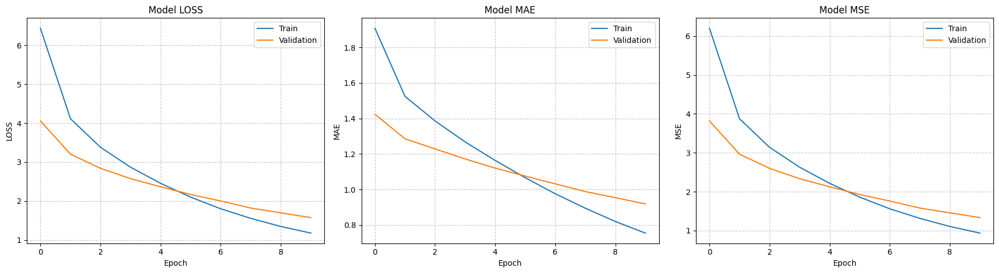


--- Final Test Set Evaluation (GW 21) ---

Evaluating test set performance...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Evaluating test set performance...{'loss': 1.6089832782745361, 'mae': 0.8908226490020752, 'mse': 1.3719402551651}
R²: 0.5005916529262363
MAE: 0.8908226490020752
MSE: 1.3719402551651001
Loss: 1.6089832782745361

Generating Predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

--- Results for Gameweek 21 ---
 Gameweek     Player  Actual_xP  Predicted_xP  Team_Diff  Opp_Diff
       21     Thiago        6.7          7.48       0.15     -1.11
       21       Rice        6.8          7.23       2.38      1.80
       21     Rogers        6.7          6.50       1.00      0.35
       21    Semenyo        6.7          6.20      -0.29      0.35
       21 N.Williams        2.7          6.02      -0.62     -1.11
       21   Bruno G.        6.0          5.59       0.51     -1.11
       21  Reijnders        5.8          5.01       1.62      0.35
       21  Yarmoliuk        4.5        

In [40]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 21)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_21 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_21.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_21 = model_21.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_21)

# EVALUATE TEST SET PERFORMANCE
print("\n--- Final Test Set Evaluation (GW 21) ---")
test_result_21 = model_21.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

evaluation_metrics = evaluator(model_21, X_test_scaled, M_test_scaled, Y_test)


print(f"Evaluating test set performance...{test_result_21}")
print(f"R²: {evaluation_metrics['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics['test_loss']:.16f}")



# Prediction
print("\nGenerating Predictions...")
Y_pred_21 = model_21.predict([X_test_scaled, M_test_scaled]).flatten()


position_21 = active_data['position'][test_mask]
teams_21 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_21, 'team': teams_21, 'position': position_21}
preds_df_21 = pd.DataFrame(players_preds)

# Results
results_df_21 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_21,
    'Team_Diff': M_test_scaled[:, 1],
    'Opp_Diff': M_test_scaled[:, 0]
})

print("\n--- Results for Gameweek 21 ---")
print(results_df_21.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))



#### Plots


###### GK


In [17]:
plot_preds(preds_df_20, 'GK', 20)


NameError: name 'preds_df_20' is not defined

###### DEF


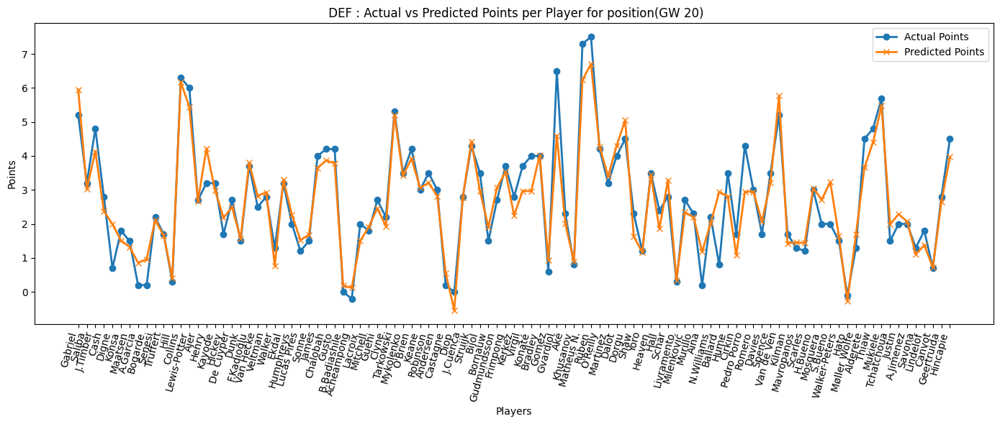

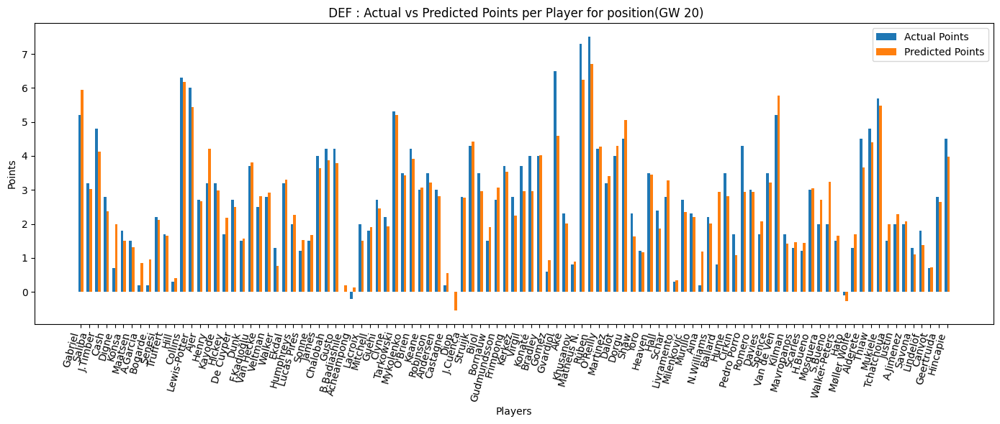

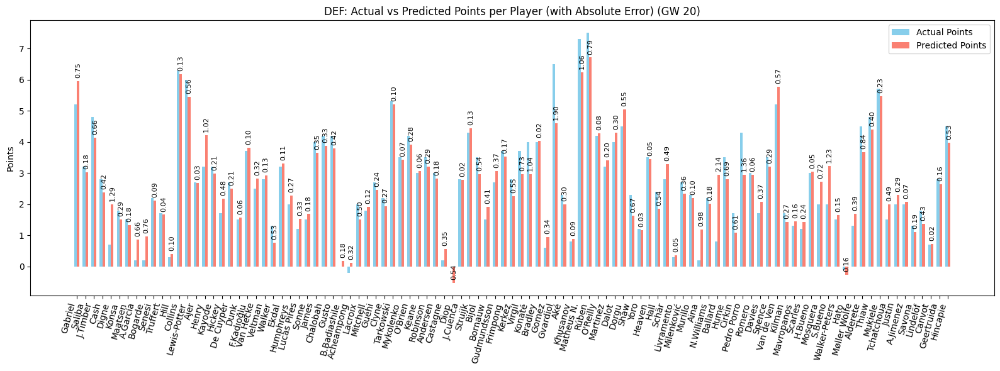

In [ ]:
plot_preds(preds_df_20, 'DEF', 20)

###### MID


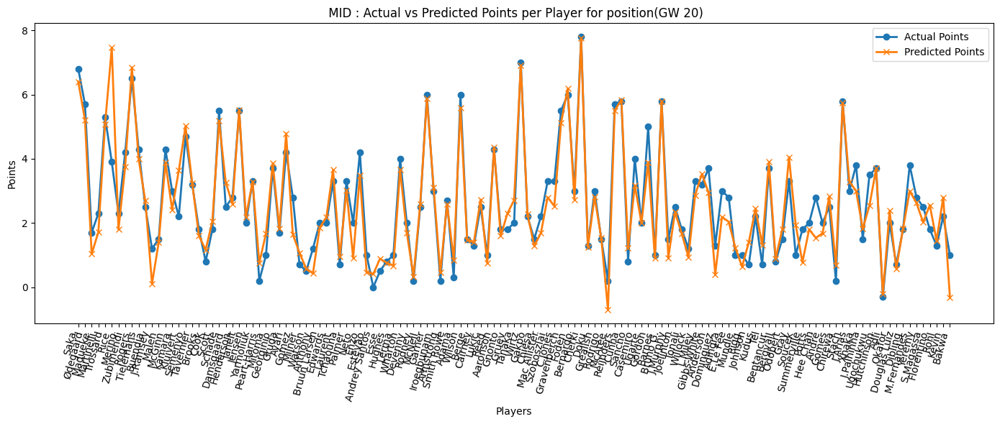

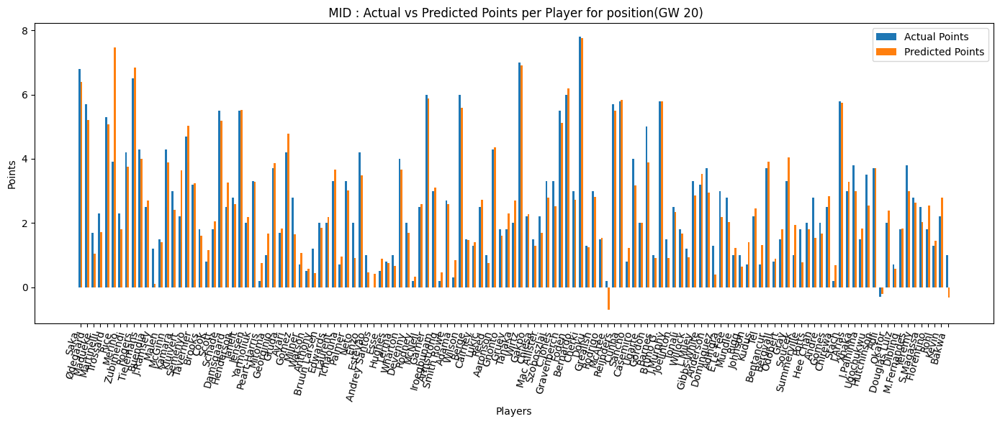

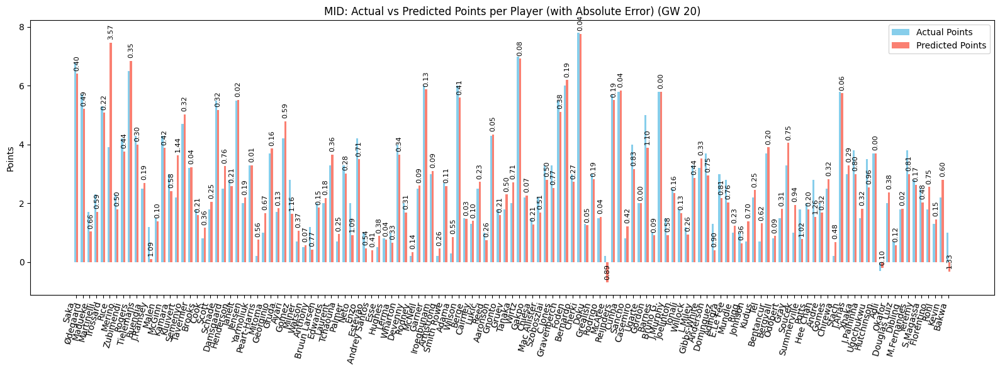

In [ ]:
plot_preds(preds_df_20, 'MID', 20)

###### FWD


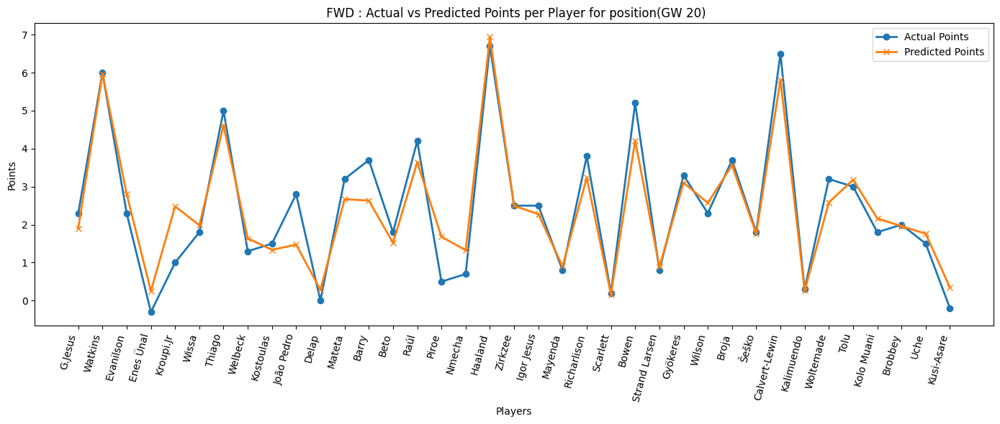

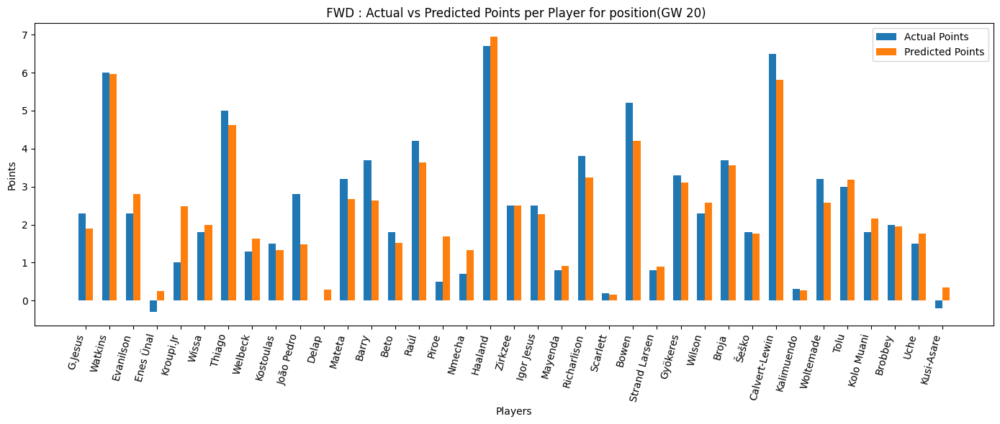

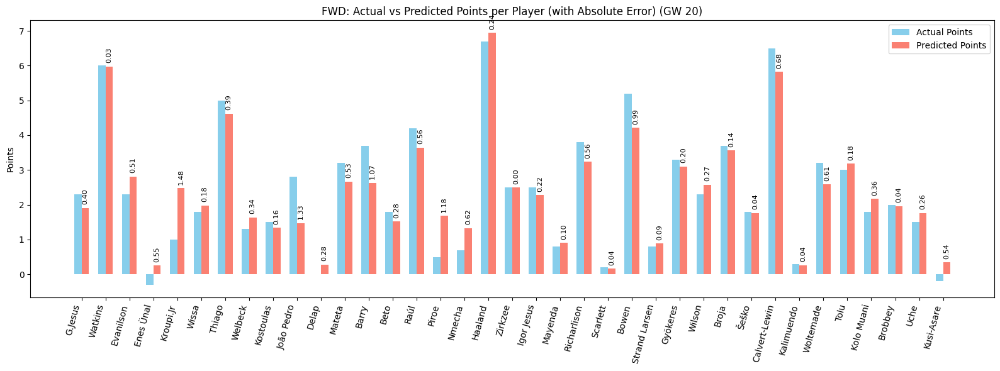

In [ ]:
plot_preds(preds_df_20, 'FWD', 20)

#### Optimize


In [41]:
squad_21, total_points_21 = get_optimized_team(Y_pred_21, 21)
squad_21

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-285.1107
IRL epoch 100/200 loss=-3220.8945
IRL epoch 150/200 loss=-13861.6748
IRL epoch 200/200 loss=-38140.6445
HGAT Policy Embeddings Shape: torch.Size([153, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
           name           team position  price   xP_pred  is_captain  is_vice
11       Rogers    Aston Villa      MID    7.6  6.495680       False    False
18      Semenyo    Bournemouth      MID    7.6  6.199854       False    False
4          Rice        Arsenal      MID    7.2  7.234309       False    False
100    Bruno G.      Newcastle      MID    7.1  5.590559       False    False
88    Reijnders       Man City      MID    5.2  5.009573       False    False
22     Kelleher      Brentford       GK    4.5  4.475522       False    False
15      Watkins    Aston Villa      FWD    8.7  4.541174       False    False
30       Thiago      Brentford      FWD    7.0  7.480032        True    False
1      J.Timber  

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,J.Timber,Arsenal,DEF,4.689270,6.0,False,False
1,Rice,Arsenal,MID,7.234309,4.5,False,False
2,Rogers,Aston Villa,MID,6.495680,3.0,False,False
3,Watkins,Aston Villa,FWD,4.541174,2.0,False,False
4,Semenyo,Bournemouth,MID,6.199854,6.0,False,False
5,Kelleher,Brentford,GK,4.475522,13.0,False,False
6,Thiago,Brentford,FWD,7.480032,24.0,True,False
7,Reijnders,Man City,MID,5.009573,2.0,False,False
8,Bruno G.,Newcastle,MID,5.590559,11.0,False,False
9,N.Williams,Nott'm Forest,DEF,6.016384,4.0,False,False


## Current


Data prepared. X shape: (3840, 55), M shape: (3840, 4), Y shape: (3840, 2)

Starting Training...
Epoch 1/10


44/44 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 15.4654 - mae: 3.2521 - mse: 15.3041 - val_loss: 9.4332 - val_mae: 2.4746 - val_mse: 9.2718
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 9.7073 - mae: 2.4045 - mse: 9.5458 - val_loss: 5.7159 - val_mae: 1.7760 - val_mse: 5.5541
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5.8851 - mae: 1.8529 - mse: 5.7230 - val_loss: 3.5795 - val_mae: 1.3873 - val_mse: 3.4170
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 3.9098 - mae: 1.4893 - mse: 3.7471 - val_loss: 2.6935 - val_mae: 1.2188 - val_mse: 2.5307
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.7594 - mae: 1.2745 - mse: 2.5966 - val_loss: 2.1758 - val_mae: 1.0925 - val_mse: 2.0130
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2.1406 - mae: 1.1046 - mse: 1.9779 - val_loss: 1.7491 - val_mae: 0.9728 - val_mse: 1.5863
Epoch 7/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.6195 - mae: 0.9638 - mse: 1.4567 - val_loss: 1.4548 - val_ma

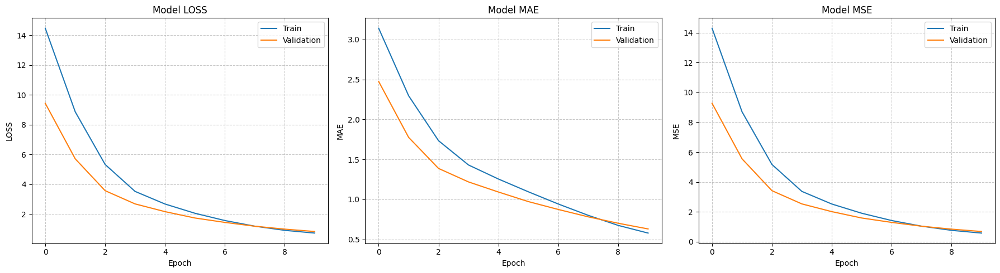


Generating Predictions...
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

--- Results for Gameweek 22 ---
 Gameweek     Player  Predicted_xP
       22    Semenyo     33.139999
       22     Thiago     25.590000
       22 João Pedro     23.680000
       22     Palmer     21.490000
       22      Foden     20.830000
       22    Ekitiké     20.389999
       22       Rice     20.100000
       22   J.Timber     19.620001
       22     Rogers     18.990000
       22  Reijnders     18.000000


In [141]:
train_data, test_data , GW_full, X_cols = transform_data(active_data_, cols, 22)
X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names = test_data

# Model Setup
INPUT_DIM_X = X_train_scaled.shape[1]
INPUT_DIM_M = M_train_scaled.shape[1]
OUTPUT_DIM_Y = 1

model_22 = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
model_22.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Training
print("\nStarting Training...")
history_22 = model_22.fit(
    [X_train_scaled, M_train_scaled], Y_train,
    epochs=10, # Increased epochs with early stopping
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stop],
    verbose=1
)

# Plot History
plot_training_history(history_22)


# Prediction
print("\nGenerating Predictions...")
Y_pred_22 = model_22.predict([X_test_scaled, M_test_scaled]).flatten()
Y_pred_22


position_22 = active_data['position'][test_mask]
teams_22 = active_data['team'][test_mask]
players_preds = {'fpl_name': Y_test_names, 'Actual_xP': Y_test, 'Pred_xP': Y_pred_22, 'team': teams_22, 'position': position_22}
preds_df_22 = pd.DataFrame(players_preds)

# Results
results_df_22 = pd.DataFrame({
    'Gameweek': GW_full[test_mask],
    'Player': Y_test_names,
    # 'Actual_xP': Y_test,
    'Predicted_xP': Y_pred_22
})

print("\n--- Results for Gameweek 22 ---")
print(results_df_22.sort_values(by='Predicted_xP', ascending=False).head(10).round(2).to_string(index=False))

# pd.DataFrame({
#     'Player': Y_test_names,
#     'Predicted_xP': Y_pred_22
# }).


In [142]:
pd.DataFrame({
    'Player': Y_test_names,
    'Predicted_xP': Y_pred_22
})

,Player,Predicted_xP
0,Raya,13.681106
1,Setford,2.028618
2,J.Timber,19.617571
3,White,1.356534
4,Ødegaard,4.297856
...,...,...
265,Graham,0.669540
266,Pablo,0.826455
267,Merrick,1.435568
268,Taty,1.579743


#### Plots


###### GK


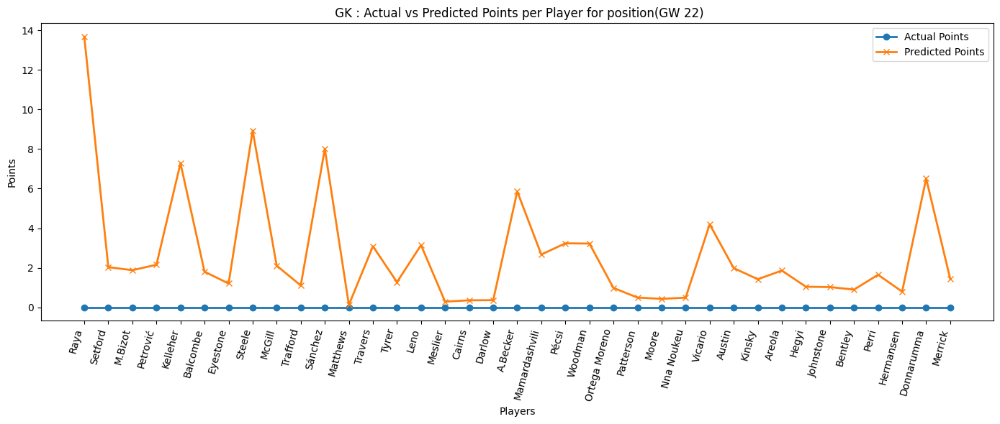

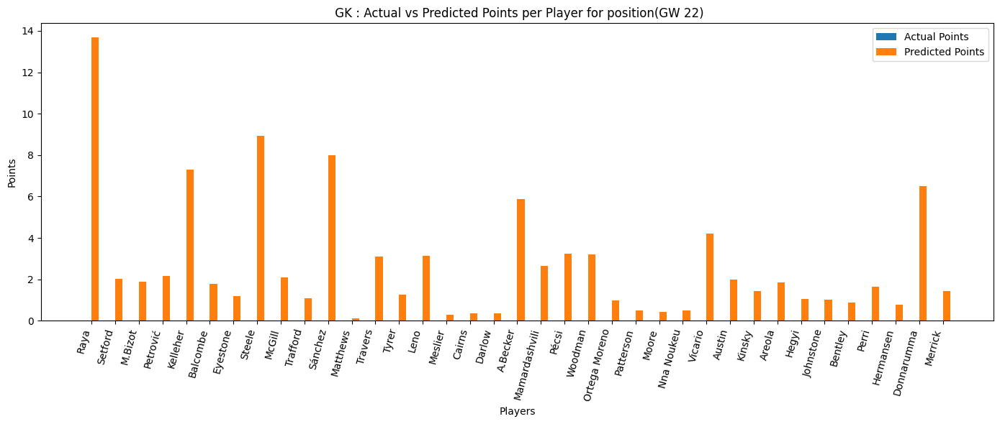

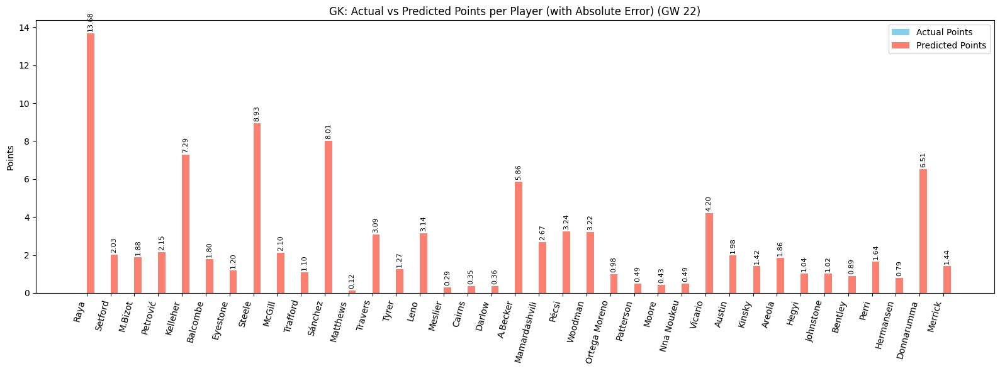

In [143]:
plot_preds(preds_df_22, 'GK', 22)


###### DEF


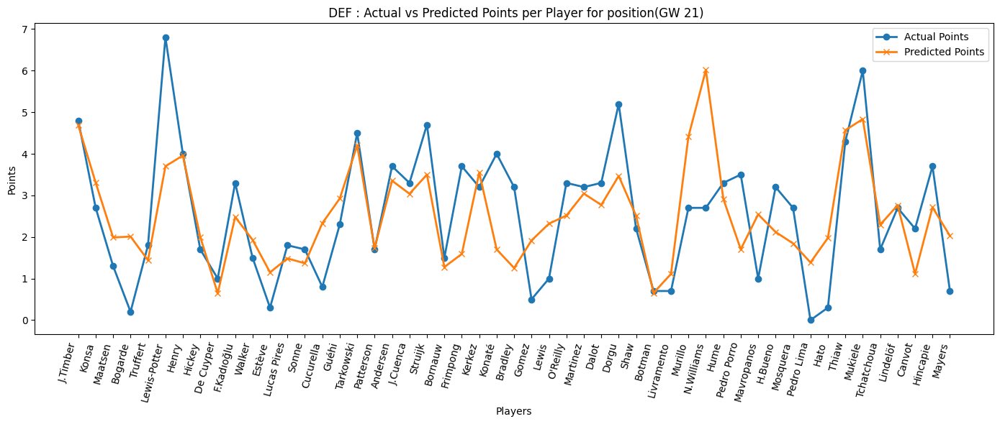

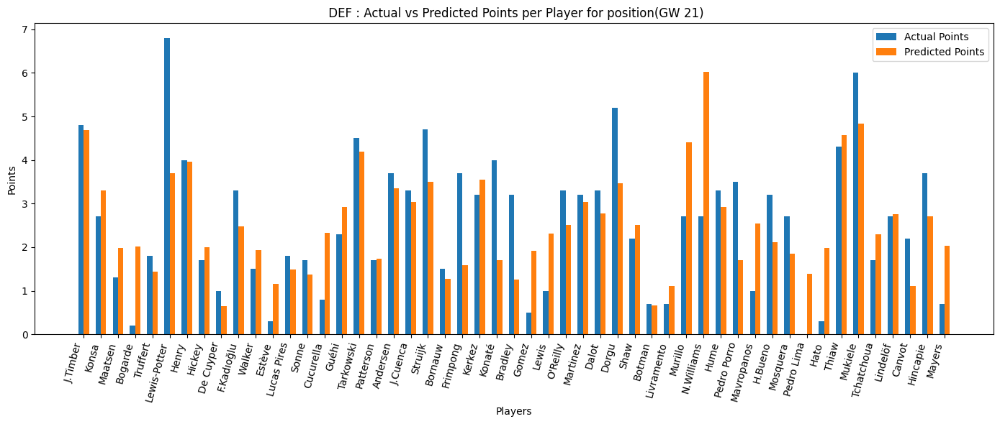

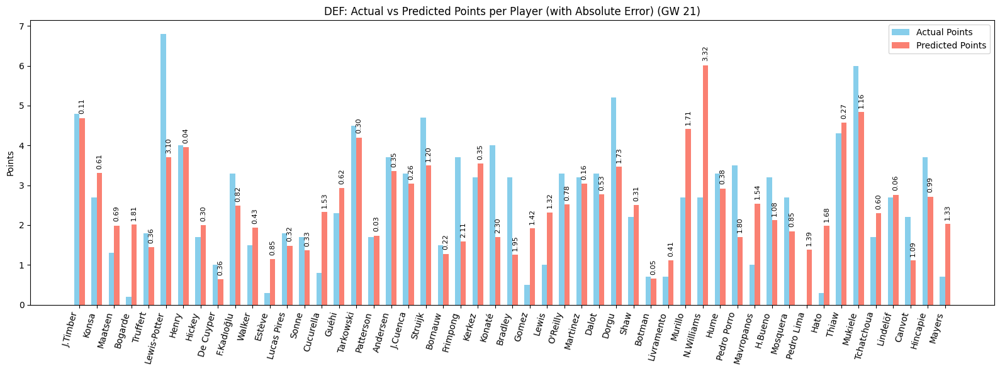

In [144]:
plot_preds(preds_df_21, 'DEF', 21)

###### MID


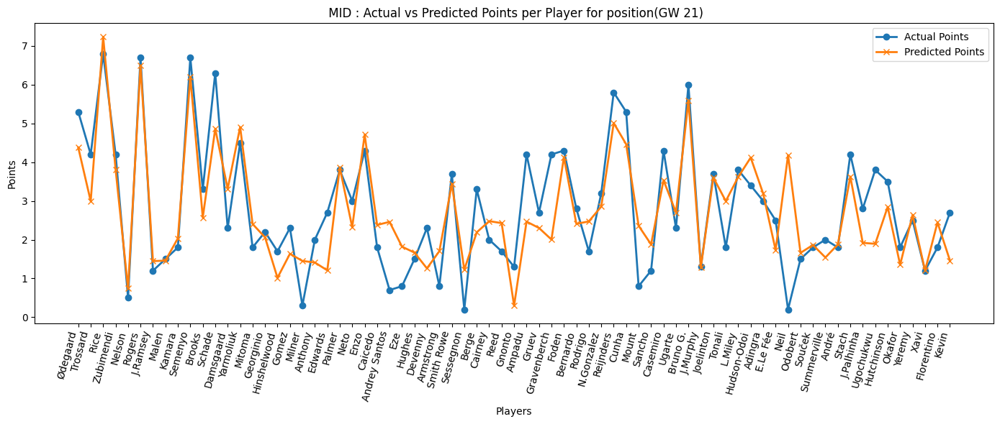

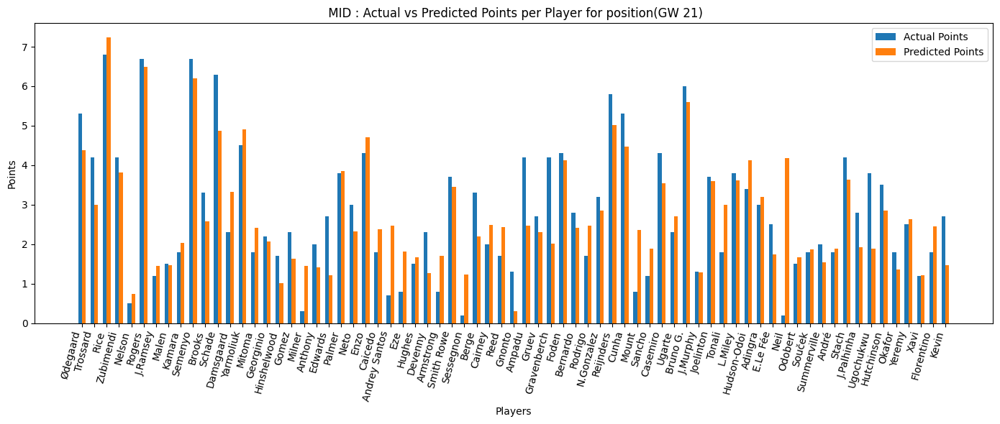

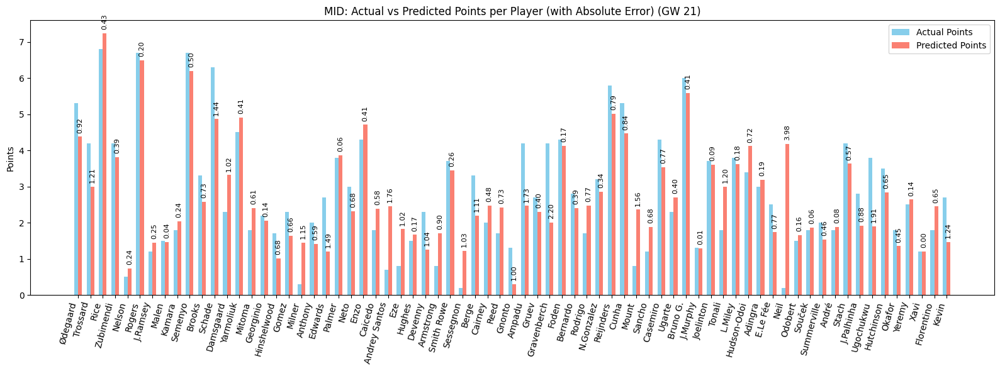

In [145]:
plot_preds(preds_df_21, 'MID', 21)

###### FWD


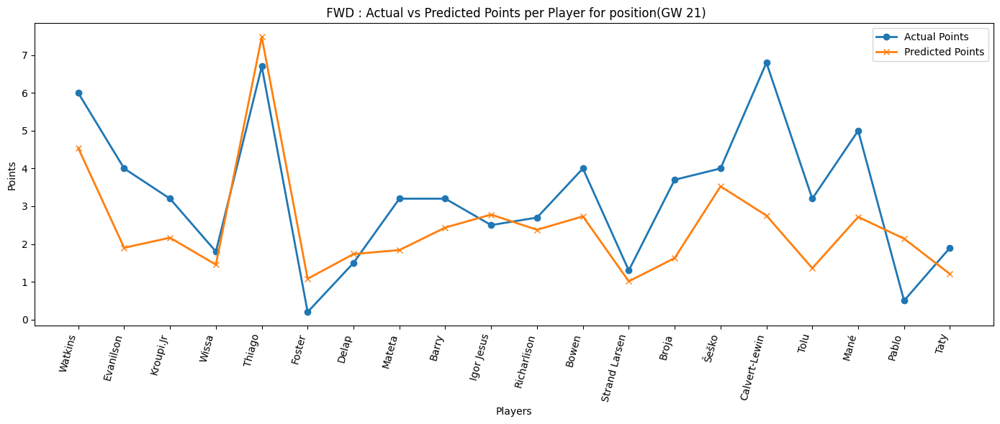

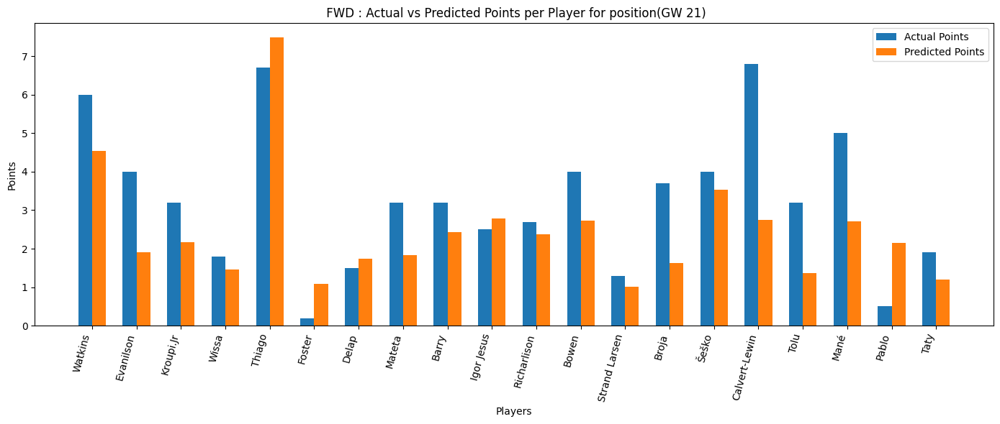

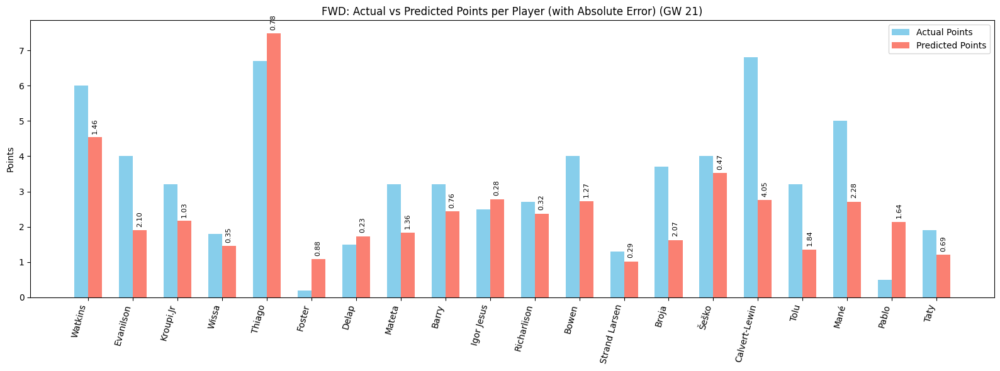

In [146]:
plot_preds(preds_df_21, 'FWD', 21)

#### Optimize


In [147]:
squad_22, total_points_22 = get_optimized_team(Y_pred_22, 22)
squad_22

Expert selected count (11-man heuristic): 11
IRL epoch 50/200 loss=-479.5543
IRL epoch 100/200 loss=-4803.4805
IRL epoch 150/200 loss=-19860.1758
IRL epoch 200/200 loss=-53720.0664
HGAT Policy Embeddings Shape: torch.Size([270, 32])

--- OPTIMAL FPL TEAM (IRL-HGAT-ILP RESULT) ---
           name            team position  price    xP_pred  is_captain  \
82       Palmer         Chelsea      MID   10.4  21.487524       False   
143       Foden        Man City      MID    8.7  20.831863       False   
30      Semenyo        Man City      MID    7.6  33.144974        True   
6          Rice         Arsenal      MID    7.3  20.096579       False   
0          Raya         Arsenal       GK    5.9  13.681106       False   
231     Ekitiké       Liverpool      FWD    8.9  20.388254       False   
51       Thiago       Brentford      FWD    7.1  25.586529       False   
87   João Pedro         Chelsea      FWD    7.1  23.683922       False   
2      J.Timber         Arsenal      DEF    6.3  19.6

,fpl_name,team,position,xP_pred,total_points,is_captain,is_vice
0,Raya,Arsenal,GK,13.681106,0.0,False,True
1,J.Timber,Arsenal,DEF,19.617571,0.0,False,False
2,Rice,Arsenal,MID,20.096579,0.0,False,False
3,Semenyo,Man City,MID,33.144974,0.0,True,False
4,Thiago,Brentford,FWD,25.586529,0.0,False,False
5,Cucurella,Chelsea,DEF,10.937217,0.0,False,False
6,Palmer,Chelsea,MID,21.487524,0.0,False,False
7,João Pedro,Chelsea,FWD,23.683922,0.0,False,False
8,Guéhi,Crystal Palace,DEF,17.970694,0.0,False,False
9,Foden,Man City,MID,20.831863,0.0,False,False
